In [221]:
import os
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
import pandas as pd
import seaborn as sns
from pandas import ExcelWriter
from pandas import ExcelFile
import sample_utils

%matplotlib inline

# TRUE DATA

In [317]:
file_path = '2020_LER_20201102_testset_V04.xlsx'

data = np.load('../data_handler/'+file_path+'.npy', allow_pickle=True)
num_in_cycle = [250]*10
num_of_cycle = 10
    
X_all, Y_all, X_per_cycle, Y_per_cycle = data[0], data[1], data[2], data[3]
print(data[0].shape, data[1].shape, data[2].shape, data[3].shape)
print()
test_real = Y_all

# for pair plot indexing
test_X_cycle = X_per_cycle

y_mean = np.mean(Y_all, axis=0, dtype=np.float32)
y_std = np.std(Y_all, axis=0, dtype=np.float32)

print("!! check !! test real shape", test_real.shape)
print("!! check !! X value ( especially its precision )")
print()
for i in range(num_of_cycle):
    print(test_X_cycle[i])

(2500, 5) (2500, 6) (10, 5) (10, 6)

!! check !! test real shape (2500, 6)
!! check !! X value ( especially its precision )

[  0.62484672  17.00743225 173.85718891   1.           0.        ]
[ 0.55654727 80.91905766 80.56986979  1.          0.        ]
[ 0.50466944 48.62398816 67.99380535  1.          0.        ]
[ 0.56045148 25.42868151 69.39740975  1.          0.        ]
[ 0.63730798 69.14860261 65.33037708  1.          0.        ]
[  0.72951307  89.39156879 205.62484728   1.           0.        ]
[ 0.15273618 23.32639122 51.25326965  1.          0.        ]
[ 0.68988283 85.08858437 80.98368203  1.          0.        ]
[ 0.25925637 78.12653757 28.08679576  1.          0.        ]
[1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]


# TRUE data_A , data_B

In [310]:
file_path = '2020_LER_20201102_testset_V04.xlsx'

seed = 7733
name = '_seed_{}'.format(seed)

# data_A

data = np.load('../data_handler/'+file_path+'_data_a'+name+'.npy', allow_pickle=True)
num_in_cycle_half = [125]*10
num_of_cycle = 10
    
A_X_all, A_Y_all, A_X_per_cycle, A_Y_per_cycle = np.array(data[0]), np.array(data[1]), np.array(data[2]), np.array(data[3])

print(A_X_all.shape, A_Y_all.shape, A_X_per_cycle.shape, A_Y_per_cycle.shape)
print()
A_test_real = A_Y_all

# for pair plot indexing
A_test_X_cycle = A_X_per_cycle

A_y_mean = np.mean(A_Y_all, axis=0, dtype=np.float32)
A_y_std = np.std(A_Y_all, axis=0, dtype=np.float32)

print("!! check !! test real shape", A_test_real.shape)
print("!! check !! X value ( especially its precision )")
print()
for i in range(num_of_cycle):
    print(A_test_X_cycle[i])

# data_B
    
data = np.load('../data_handler/'+file_path+'_data_b'+name+'.npy', allow_pickle=True)
    
B_X_all, B_Y_all, B_X_per_cycle, B_Y_per_cycle = np.array(data[0]), np.array(data[1]), np.array(data[2]), np.array(data[3])
print(B_X_all.shape, B_Y_all.shape, B_X_per_cycle.shape, B_Y_per_cycle.shape)
print()
B_test_real = B_Y_all

# for pair plot indexing
B_test_X_cycle = B_X_per_cycle

B_y_mean = np.mean(B_Y_all, axis=0, dtype=np.float32)
B_y_std = np.std(B_Y_all, axis=0, dtype=np.float32)

print("!! check !! test real shape", B_test_real.shape)
print("!! check !! X value ( especially its precision )")
print()
for i in range(num_of_cycle):
    print(B_test_X_cycle[i])

(1250, 5) (1250, 6) (10, 5) (10, 6)

!! check !! test real shape (1250, 6)
!! check !! X value ( especially its precision )

[  0.62484672  17.00743225 173.85718891   1.           0.        ]
[ 0.55654727 80.91905766 80.56986979  1.          0.        ]
[ 0.50466944 48.62398816 67.99380535  1.          0.        ]
[ 0.56045148 25.42868151 69.39740975  1.          0.        ]
[ 0.63730798 69.14860261 65.33037708  1.          0.        ]
[  0.72951307  89.39156879 205.62484728   1.           0.        ]
[ 0.15273618 23.32639122 51.25326965  1.          0.        ]
[ 0.68988283 85.08858437 80.98368203  1.          0.        ]
[ 0.25925637 78.12653757 28.08679576  1.          0.        ]
[1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]
(1250, 5) (1250, 6) (10, 5) (10, 6)

!! check !! test real shape (1250, 6)
!! check !! X value ( especially its precision )

[  0.62484672  17.00743225 173.85718891   1.           0.        ]
[ 0.55654727 80.91905766 80.56986979 

# STEP 1. 두개의 TRUE DATA 비교(125개씩)

# SCALE

In [311]:
min1_per_out_v = A_test_real.min(axis=0)
max1_per_out_v = A_test_real.max(axis=0)
print("minimum y value for each varaible:", min1_per_out_v)
print("maximum y value for each varaible:", max1_per_out_v)

min2_per_out_v = B_test_real.min(axis=0)
max2_per_out_v = B_test_real.max(axis=0)
print("minimum y value for each varaible:", min2_per_out_v)
print("maximum y value for each varaible:", max2_per_out_v)

min_per_out_v = np.minimum(min1_per_out_v, min2_per_out_v)
max_per_out_v = np.maximum(max1_per_out_v, max2_per_out_v)

minimum y value for each varaible: [4.0750e-13 2.6090e-05 1.1970e-05 3.1800e-01 3.3000e-01 6.0765e+01]
maximum y value for each varaible: [8.3370e-12 4.5900e-05 1.8750e-05 3.8600e-01 3.8800e-01 6.3893e+01]
minimum y value for each varaible: [3.0220e-13 2.8550e-05 1.1500e-05 3.2300e-01 3.3500e-01 6.0856e+01]
maximum y value for each varaible: [6.1180e-12 4.5100e-05 1.8540e-05 3.9400e-01 3.9700e-01 6.3371e+01]


# EMD integral

In [312]:
# EMD  

EMD_1d_score_list, EMD_2d_score_list = sample_utils.EMD_all_pair_each_X_integral(generated_samples = A_test_real, real_samples = B_test_real, num_coordinate=10, num_of_cycle=num_of_cycle, num_in_gen_list=num_in_cycle_half, num_in_real_list = num_in_cycle_half, min_list = min_per_out_v, max_list = max_per_out_v) 

print(EMD_1d_score_list.shape)
print(EMD_2d_score_list.shape)

EMD_score_cat = np.hstack((EMD_1d_score_list, EMD_2d_score_list))

EMD_score = np.mean(EMD_score_cat)
EMD_score_list_integral = np.mean(EMD_score_cat,axis=1)
EMD_std = np.sqrt(np.mean((EMD_score - EMD_score_list_integral)**2))

for i in range(len(EMD_score_list_integral)):
    print("EMD_score for each X factor {} \t score {:5f} \t dev {:5f}".format(i, EMD_score_list_integral[i], (EMD_score_list_integral[i]-EMD_score)/EMD_std))
# A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classs

EMD_score_list = np.array(EMD_score_list_integral)
print("EMD score: ", EMD_score)

 
print("EMD argsort: ", EMD_score_list.argsort())

(10, 6)
(10, 15)
EMD_score for each X factor 0 	 score 0.211308 	 dev 0.903415
EMD_score for each X factor 1 	 score 0.127168 	 dev -0.295411
EMD_score for each X factor 2 	 score 0.148242 	 dev 0.004850
EMD_score for each X factor 3 	 score 0.181518 	 dev 0.478963
EMD_score for each X factor 4 	 score 0.248117 	 dev 1.427862
EMD_score for each X factor 5 	 score 0.216261 	 dev 0.973986
EMD_score for each X factor 6 	 score 0.030676 	 dev -1.670226
EMD_score for each X factor 7 	 score 0.185876 	 dev 0.541057
EMD_score for each X factor 8 	 score 0.062768 	 dev -1.212981
EMD_score for each X factor 9 	 score 0.067082 	 dev -1.151514
EMD score:  0.14790136659285053
EMD argsort:  [6 8 9 1 2 3 7 0 5 4]


# SAME SCALE

factor 0
0 125
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [  0.62484672  17.00743225 173.85718891   1.           0.        ]


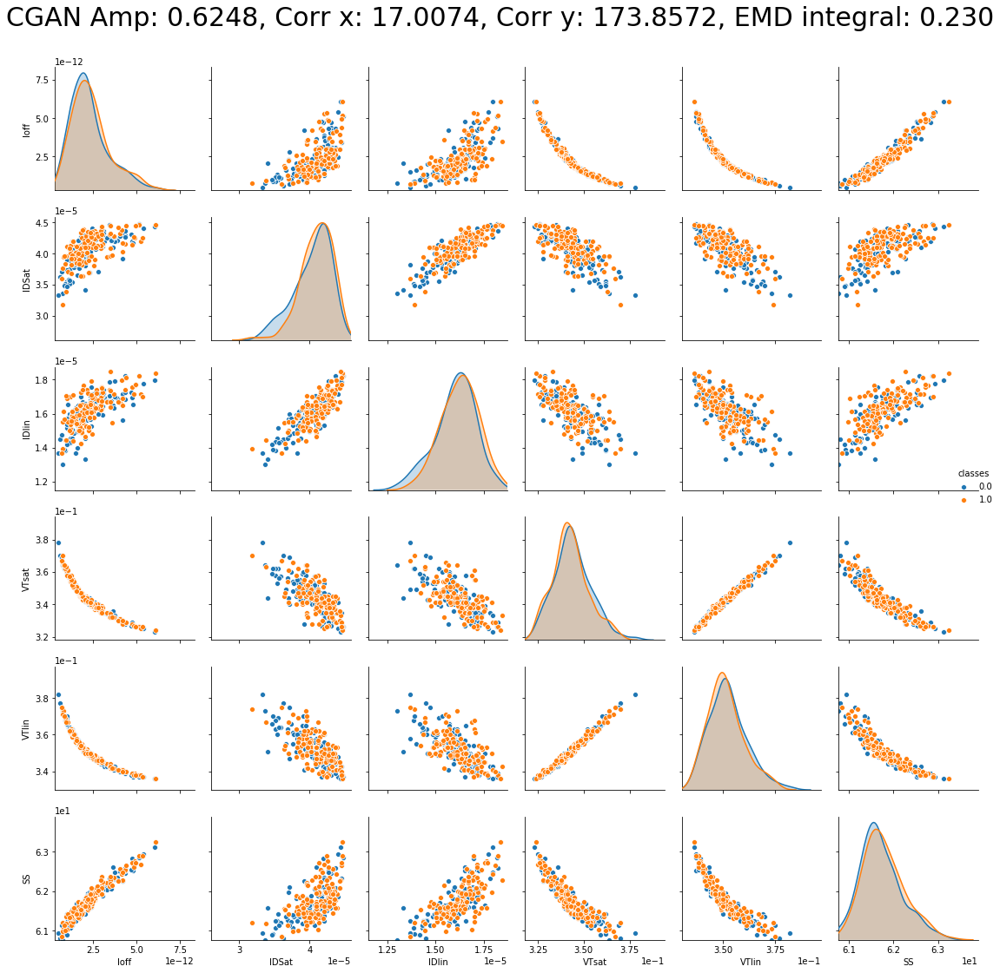

factor 1
125 250
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.55654727 80.91905766 80.56986979  1.          0.        ]


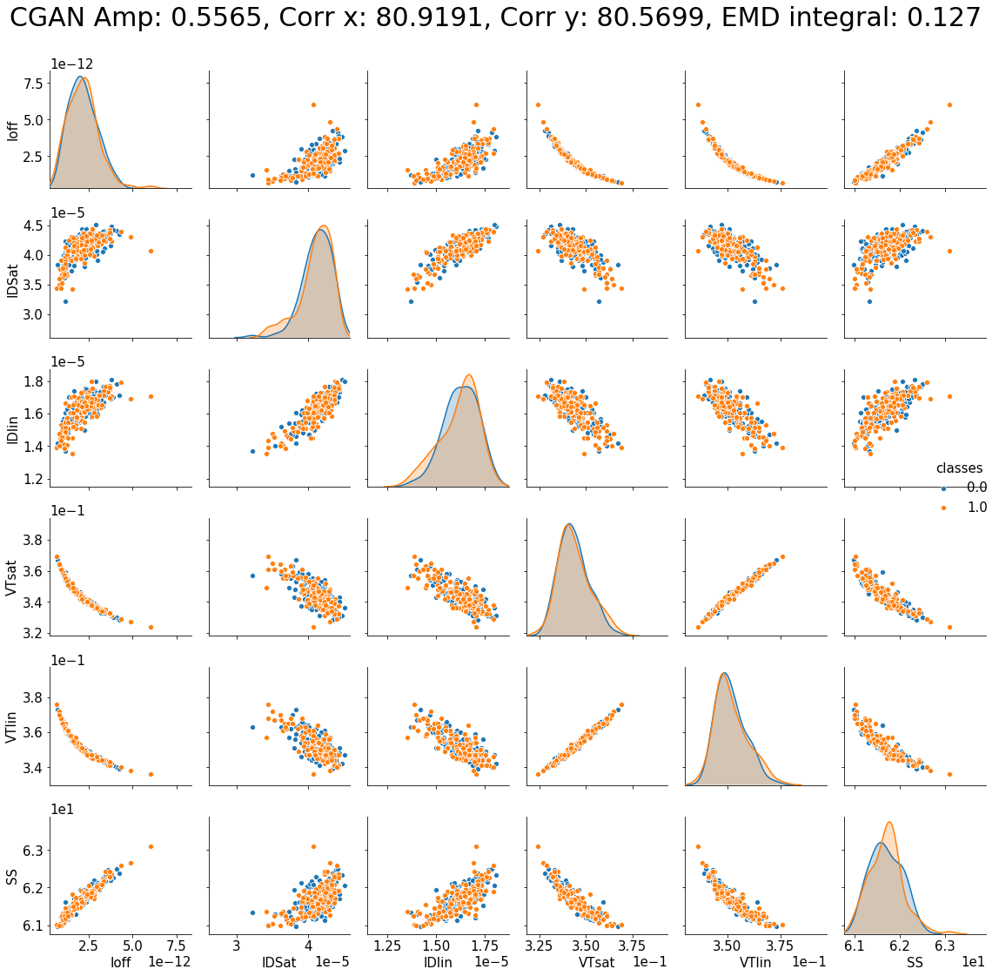

factor 2
250 375
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


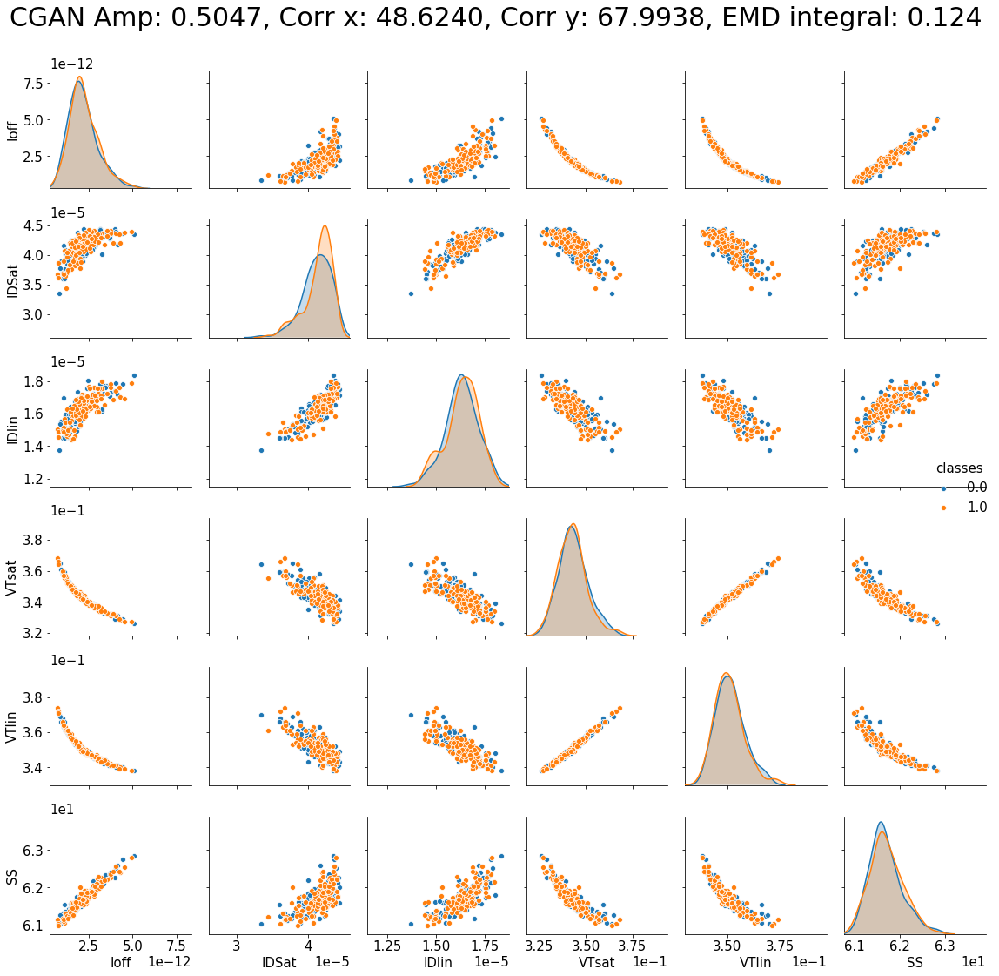

factor 3
375 500
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.56045148 25.42868151 69.39740975  1.          0.        ]


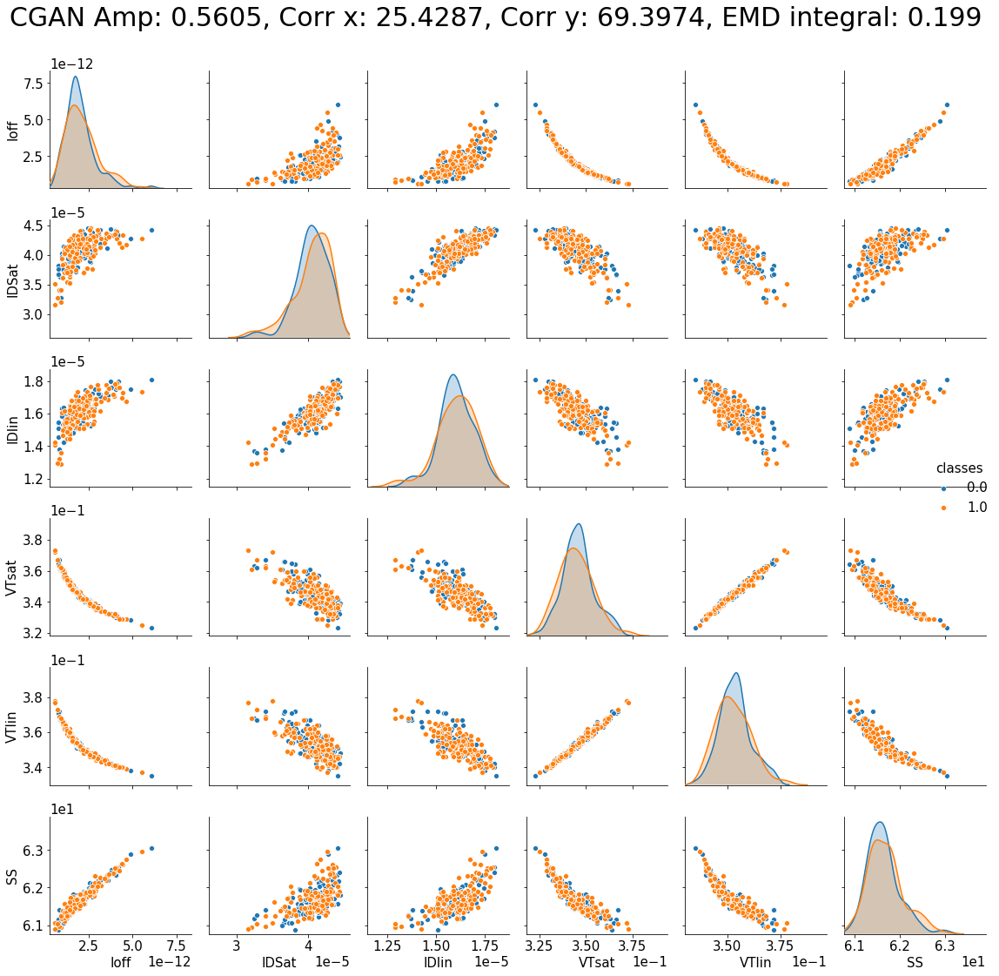

factor 4
500 625
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.63730798 69.14860261 65.33037708  1.          0.        ]


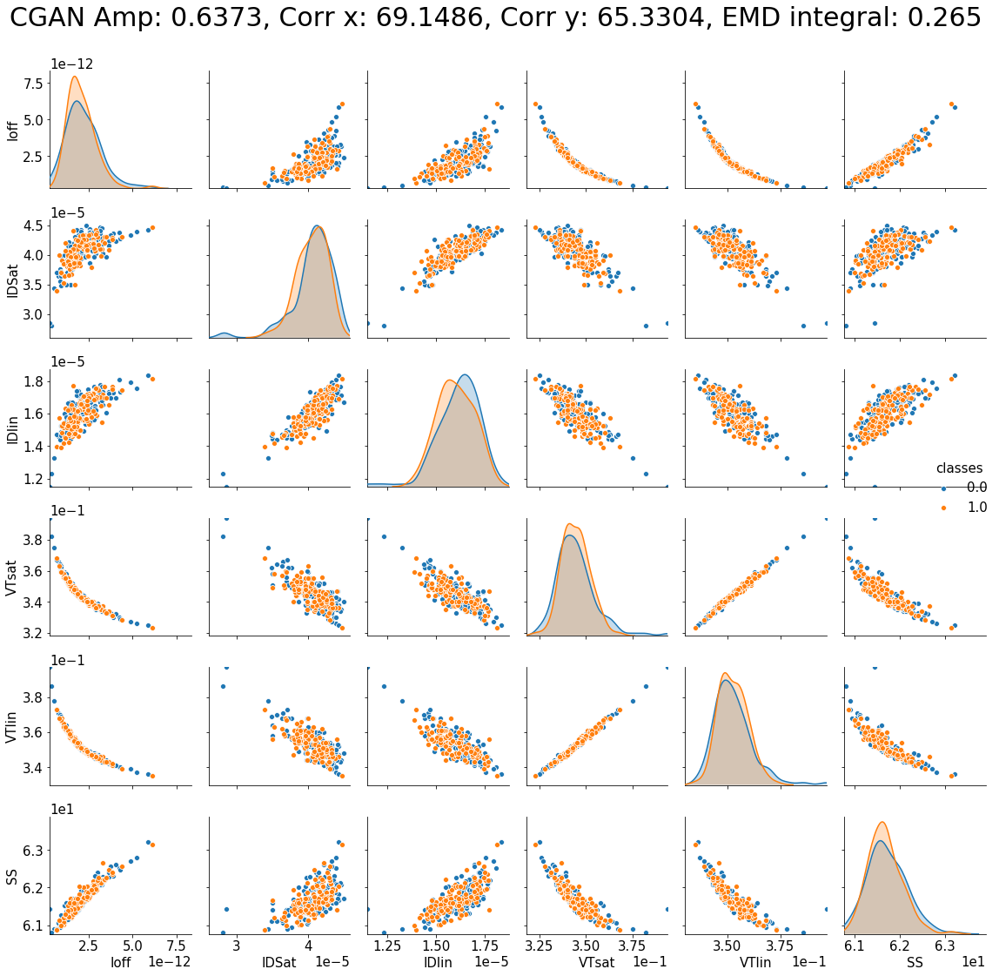

factor 5
625 750
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [  0.72951307  89.39156879 205.62484728   1.           0.        ]


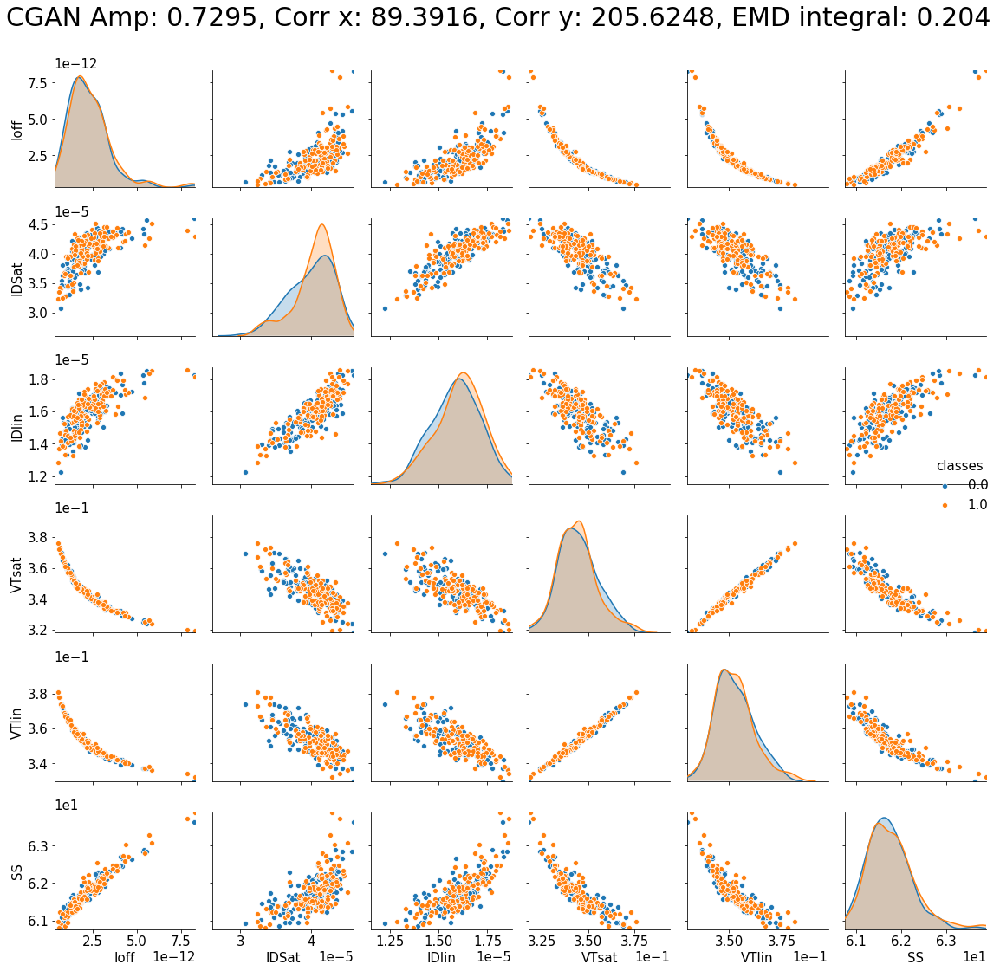

factor 6
750 875
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.15273618 23.32639122 51.25326965  1.          0.        ]


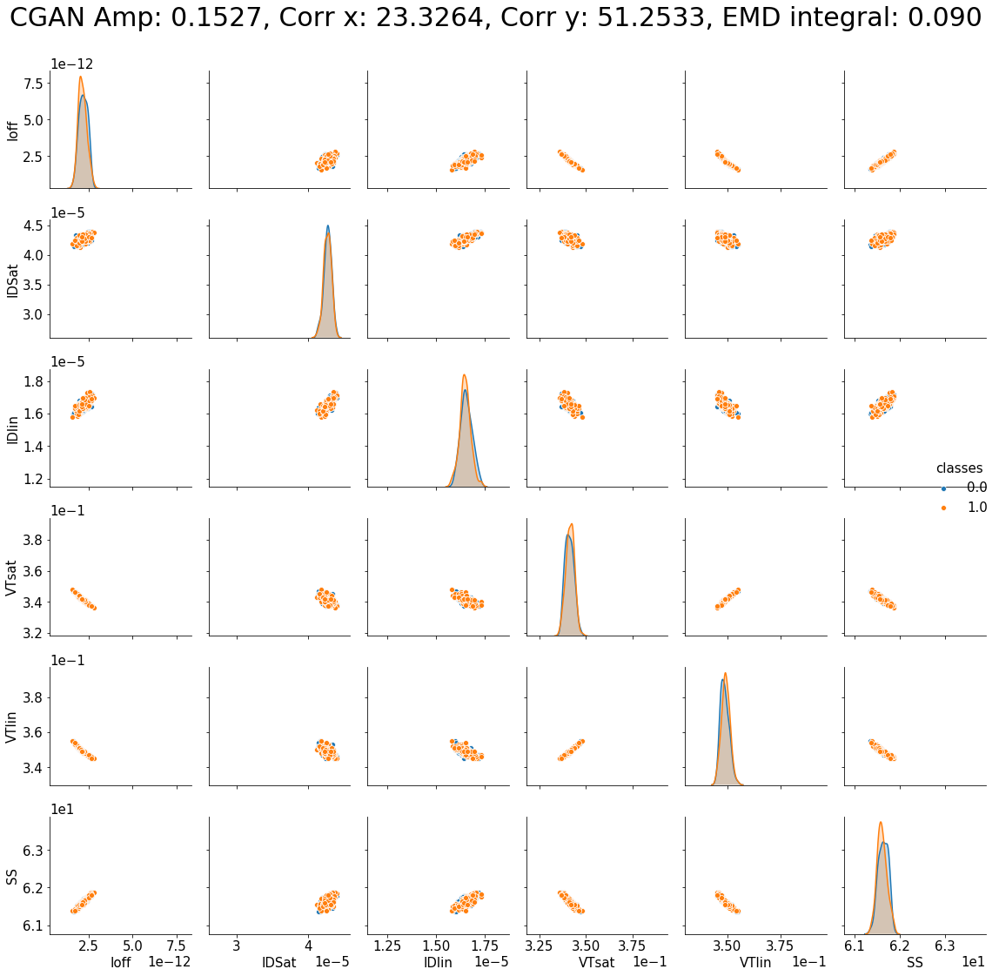

factor 7
875 1000
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.68988283 85.08858437 80.98368203  1.          0.        ]


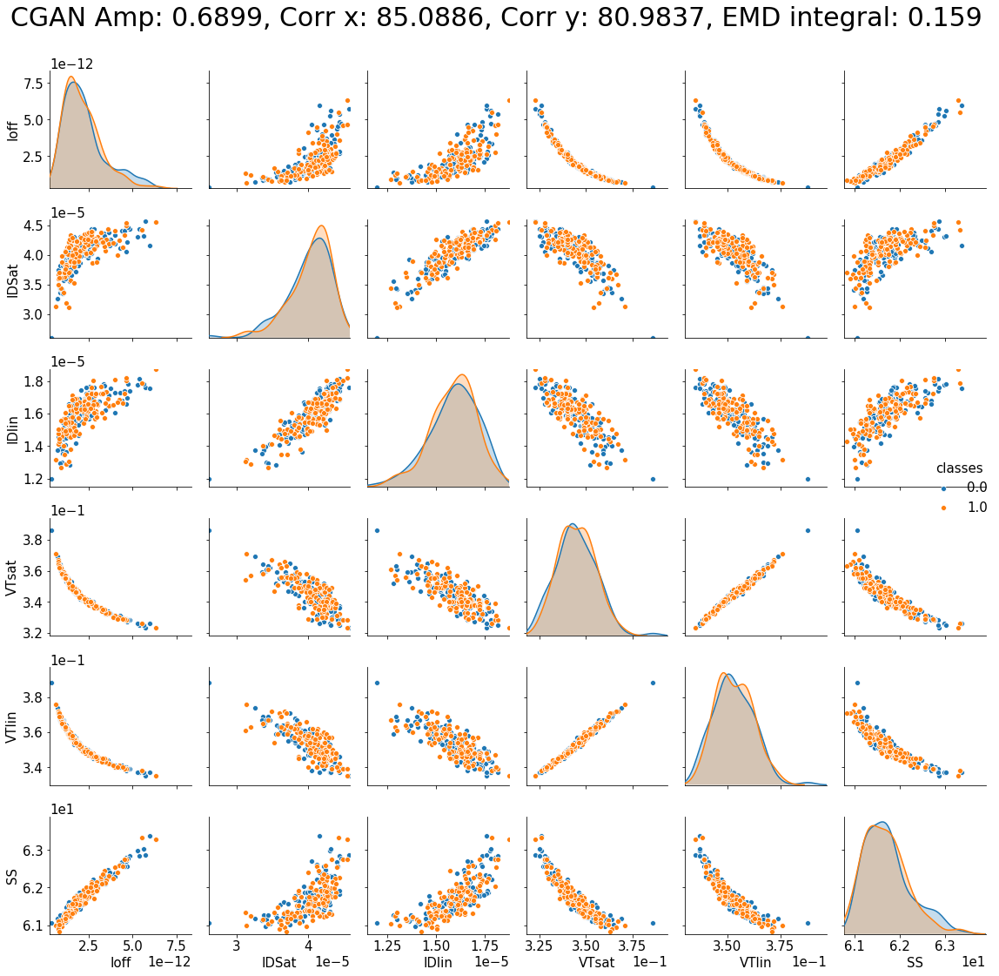

factor 8
1000 1125
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.25925637 78.12653757 28.08679576  1.          0.        ]


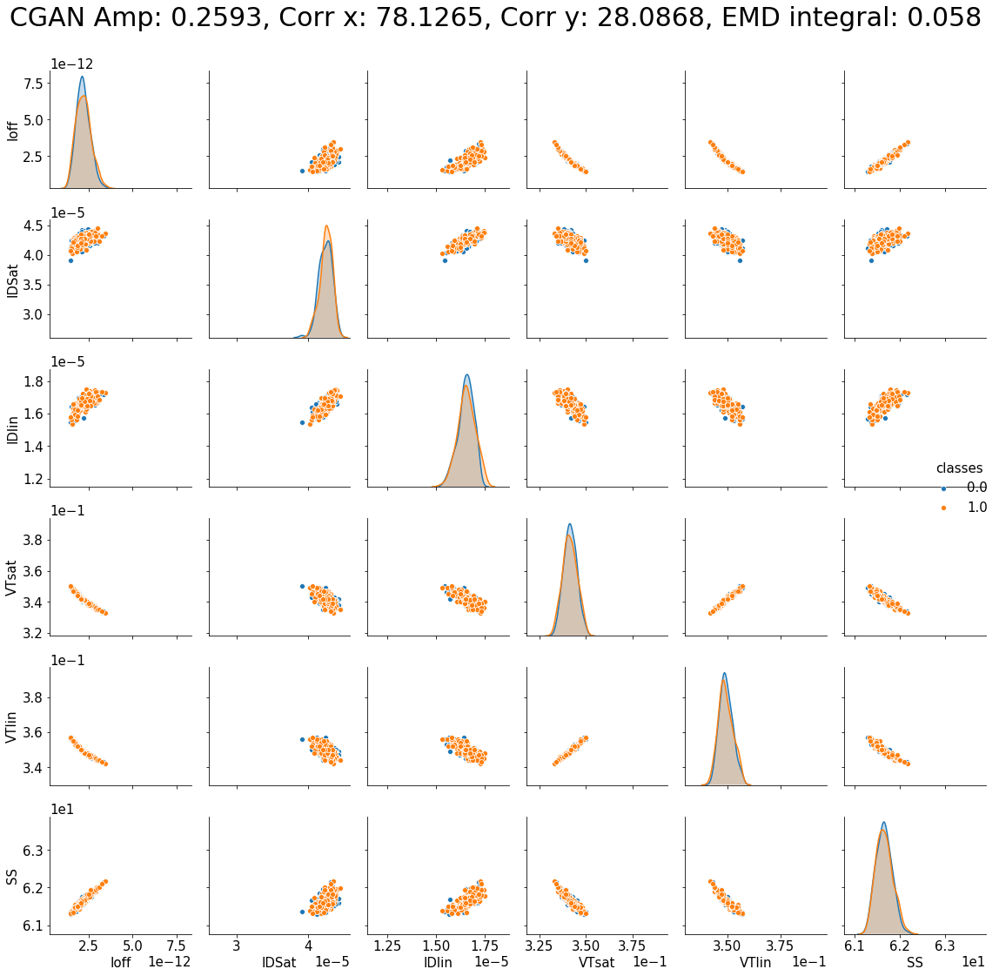

factor 9
1125 1250
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]


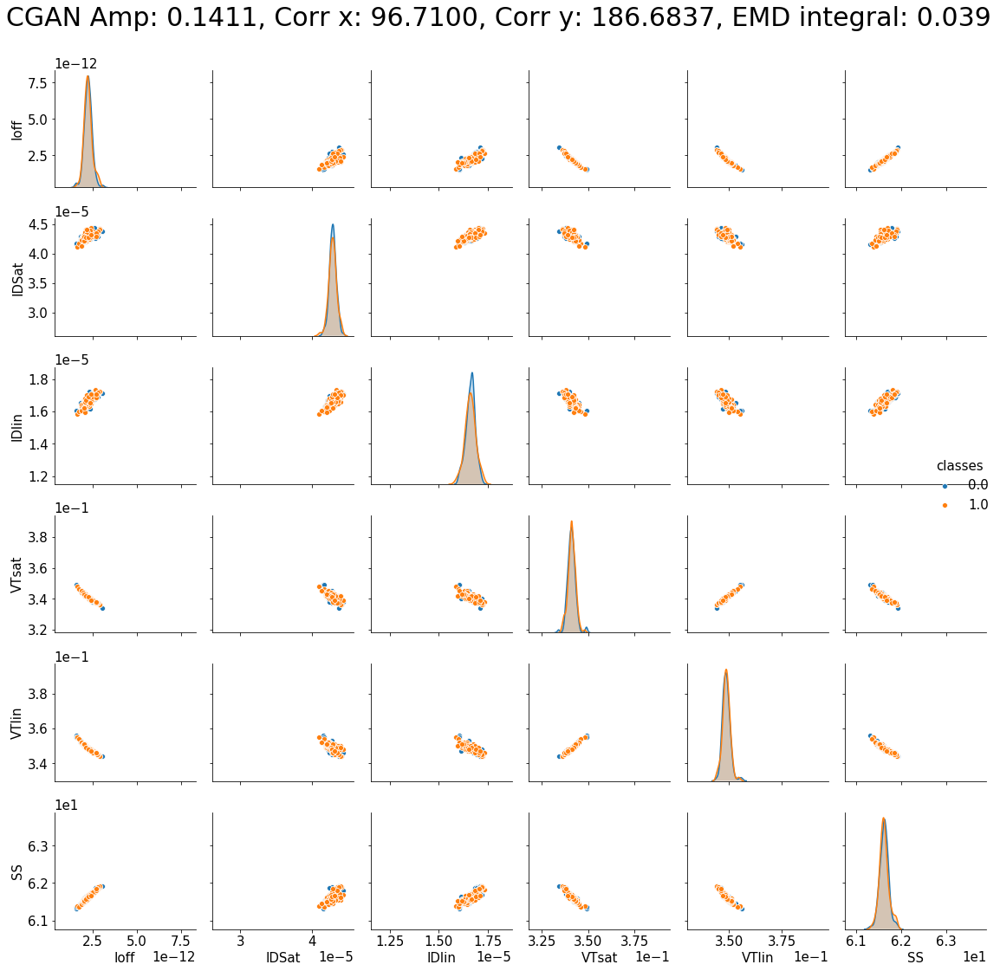

In [233]:
for factor in range(num_of_cycle):
    
    print("factor", factor)

    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    print(sum(num_in_cycle_half[:factor]),sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor])
    test_real_A_matrix_plot = A_test_real[sum(num_in_cycle_half[:factor]):sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor]]
    print("real A sample shape:", test_real_A_matrix_plot.shape)

    # real sample
    test_real_B_matrix_plot = B_test_real[sum(num_in_cycle_half[:factor]):sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor]]
    print("real B sample shape:", test_real_B_matrix_plot.shape)
    print()

    # Assigning class(B: 0, A:1 ) for visualization

    print("Assigning class for visualization (B: 0, A:1 )")

    test_real_A_cls = np.ones((num_in_cycle_half[factor], 1))
    print("real A sample class shape:", test_real_A_cls.shape)
    test_real_B_cls = np.zeros((num_in_cycle_half[factor], 1))
    print("real B sample class shape:", test_real_B_cls.shape)

    test_temp1 = np.hstack([test_real_A_matrix_plot, test_real_A_cls])
    test_temp2 = np.hstack([test_real_B_matrix_plot, test_real_B_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)
    
#     print(np.min(test_min_list))
#     print(np.max(test_max_list, axis=1))
    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.4f}, Corr x: {:.4f}, Corr y: {:.4f}, EMD integral: {:.3f}".format(X_test[0], X_test[1], X_test[2], EMD_score_list_integral[factor]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((min_per_out_v[i], max_per_out_v[i]))
        g.axes[i,i].set_ylim((min_per_out_v[i], max_per_out_v[i]))
    
    for ax in g.axes.flatten():
        ax.ticklabel_format(style='sci', scilimits=(0,0), axis='both')
    
    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.savefig('figures/real_Test_same_factor_{}_sample_{}_seed_{}.pdf'.format(factor, test_gen_sample_num, seed), bbox_inches='tight', transparent=True, pad_inches=0)
    plt.show()
    
    ### 파란색이 real 주황색이 generated

# STEP 2. TRUE와 GENERARED DATA 비교 (125개씩)

# GENERATED DATA
### Please put your sampled data file(in .npy) in the same directory

In [313]:
########################################  CHANGE HERE ####################################################################

result = 'test_specificnaive_date_210130_data_2020_LER_20201008_V008.xlsx_model_mlp_gan1_seed_8437_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_noise_d_100_sample_num_125_tr_num_in_cycle_50_pdrop_0.9.npy'

# test_stest_specificnaive_date_210130_data_2020_LER_20201008_V008.xlsx_model_mlp_gan1_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_noise_d_100_sample_num_250_tr_num_in_cycle_50_pdrop_0.9.npypecificnaive_date_210130_data_2020_LER_20201008_V008.xlsx_model_mlp_gan1_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_noise_d_100_sample_num_125_tr_num_in_cycle_50_pdrop_0.9.npy

# 현재 베스트 : test_specificdate_210118_data_2020_LER_20201008_V008.xlsx_model_mlp_constant_gan2_seed_0_lr_5e-05_0.0001_0.002_hidden_dim_200_50_batch_size_32_noise_d_500_sample_num_125_tr_num_in_cycle_50_pdrop_0.5.npy

# mean 상수 변경 전: test_specificdate_201101_data_2020_LER_20201008_V008.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_noise_d_100_sample_num_125_tr_num_in_cycle_50_pdrop_0.5.npy
# mean 상수 변경: test_specificdate_210109_data_2020_LER_20201008_V008.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_200_50_batch_size_32_noise_d_100_sample_num_150_tr_num_in_cycle_50_pdrop_0.5.npy
# test_specificdate_210113_GIT_data_2020_LER_20201008_V008.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_noise_d_100_sample_num_125_tr_num_in_cycle_50_pdrop_0.5.npy

##########################################################################################################################

test_gen = np.load(result, allow_pickle=True)

num_of_cycle = 10


test_gen_sample_num = int(test_gen.shape[0]/num_of_cycle)

print("test data sample num", test_gen_sample_num)
print("test data shape", test_gen.shape)


test data sample num 125
test data shape (1250, 6)


# SCALE

In [314]:
min1_per_out_v = A_test_real.min(axis=0)
max1_per_out_v = A_test_real.max(axis=0)
print("minimum y value for each varaible:", min1_per_out_v)
print("maximum y value for each varaible:", max1_per_out_v)

min2_per_out_v = test_gen.min(axis=0)
max2_per_out_v = test_gen.max(axis=0)
print("minimum y value for each varaible:", min2_per_out_v)
print("maximum y value for each varaible:", max2_per_out_v)

min_per_out_v = np.minimum(min1_per_out_v, min2_per_out_v)
max_per_out_v = np.maximum(max1_per_out_v, max2_per_out_v)

minimum y value for each varaible: [4.0750e-13 2.6090e-05 1.1970e-05 3.1800e-01 3.3000e-01 6.0765e+01]
maximum y value for each varaible: [8.3370e-12 4.5900e-05 1.8750e-05 3.8600e-01 3.8800e-01 6.3893e+01]
minimum y value for each varaible: [4.14863736e-13 2.81223542e-05 1.22535207e-05 3.19134273e-01
 3.32856573e-01 6.07690138e+01]
maximum y value for each varaible: [6.13961605e-12 4.58256828e-05 1.87724459e-05 3.74198474e-01
 3.80758264e-01 6.33907760e+01]


# EMD Integral

In [316]:
# EMD  

EMD_1d_score_list, EMD_2d_score_list = sample_utils.EMD_all_pair_each_X_integral(generated_samples = test_gen, real_samples = B_test_real, num_coordinate=10, num_of_cycle=num_of_cycle, num_in_gen_list=[test_gen_sample_num]*num_of_cycle, num_in_real_list = num_in_cycle_half, min_list = min_per_out_v, max_list = max_per_out_v) 

print(EMD_1d_score_list.shape)
print(EMD_2d_score_list.shape)

EMD_score_cat = np.hstack((EMD_1d_score_list, EMD_2d_score_list))

EMD_score = np.mean(EMD_score_cat)
EMD_score_list_integral = np.mean(EMD_score_cat,axis=1)
EMD_std = np.sqrt(np.mean((EMD_score - EMD_score_list_integral)**2))

for i in range(len(EMD_score_list_integral)):
    print("EMD_score for each X factor {} \t score {:5f} \t dev {:5f}".format(i, EMD_score_list_integral[i], (EMD_score_list_integral[i]-EMD_score)/EMD_std))
# A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classs

EMD_score_list = np.array(EMD_score_list_integral)
print("EMD score: ", EMD_score)

 
print("EMD argsort: ", EMD_score_list.argsort())

(10, 6)
(10, 15)
EMD_score for each X factor 0 	 score 0.229330 	 dev -0.050506
EMD_score for each X factor 1 	 score 0.459928 	 dev 1.647366
EMD_score for each X factor 2 	 score 0.240137 	 dev 0.029067
EMD_score for each X factor 3 	 score 0.324814 	 dev 0.652535
EMD_score for each X factor 4 	 score 0.262072 	 dev 0.190573
EMD_score for each X factor 5 	 score 0.443478 	 dev 1.526247
EMD_score for each X factor 6 	 score 0.075083 	 dev -1.186214
EMD_score for each X factor 7 	 score 0.177738 	 dev -0.430374
EMD_score for each X factor 8 	 score 0.100034 	 dev -1.002500
EMD_score for each X factor 9 	 score 0.049281 	 dev -1.376193
EMD score:  0.2361896172229622
EMD argsort:  [9 6 8 7 0 2 4 3 5 1]


# GEN / REAL ( 개당 125개, 10set ) Pair plot

# 1. Custom scale

factor 0
0 125
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [6.13500000e-13 3.14580859e-05 1.30001732e-05 3.22852034e-01
 3.35388068e-01 6.08040000e+01 0.00000000e+00]
maximum y value for each varaible: [7.03710164e-12 4.47500000e-05 1.84700000e-05 3.71901383e-01
 3.77000000e-01 6.35733124e+01 1.00000000e+00]
X input [  0.62484672  17.00743225 173.85718891   1.           0.        ]


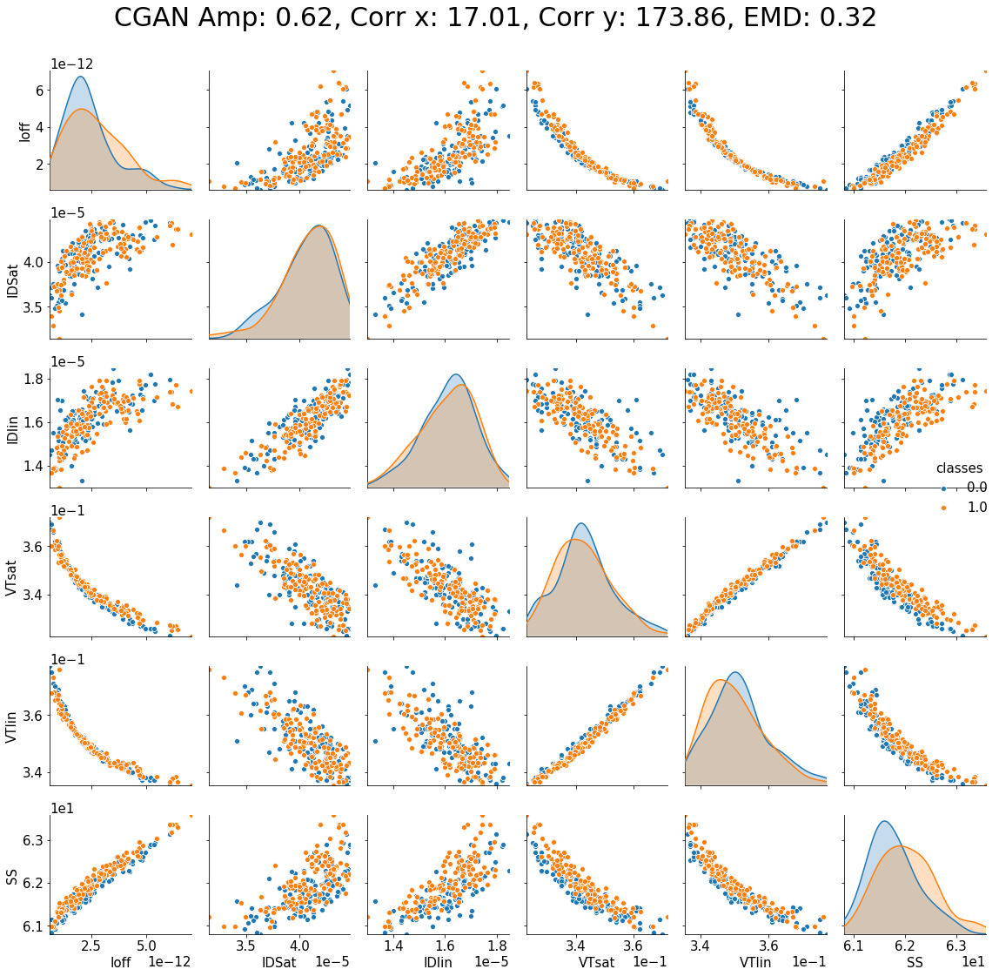

factor 1
125 250
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [8.21800000e-13 3.38233523e-05 1.40000000e-05 3.24000000e-01
 3.36000000e-01 6.09940000e+01 0.00000000e+00]
maximum y value for each varaible: [6.02805704e-12 4.43600000e-05 1.79500000e-05 3.65000000e-01
 3.72000000e-01 6.32932457e+01 1.00000000e+00]
X input [ 0.55654727 80.91905766 80.56986979  1.          0.        ]


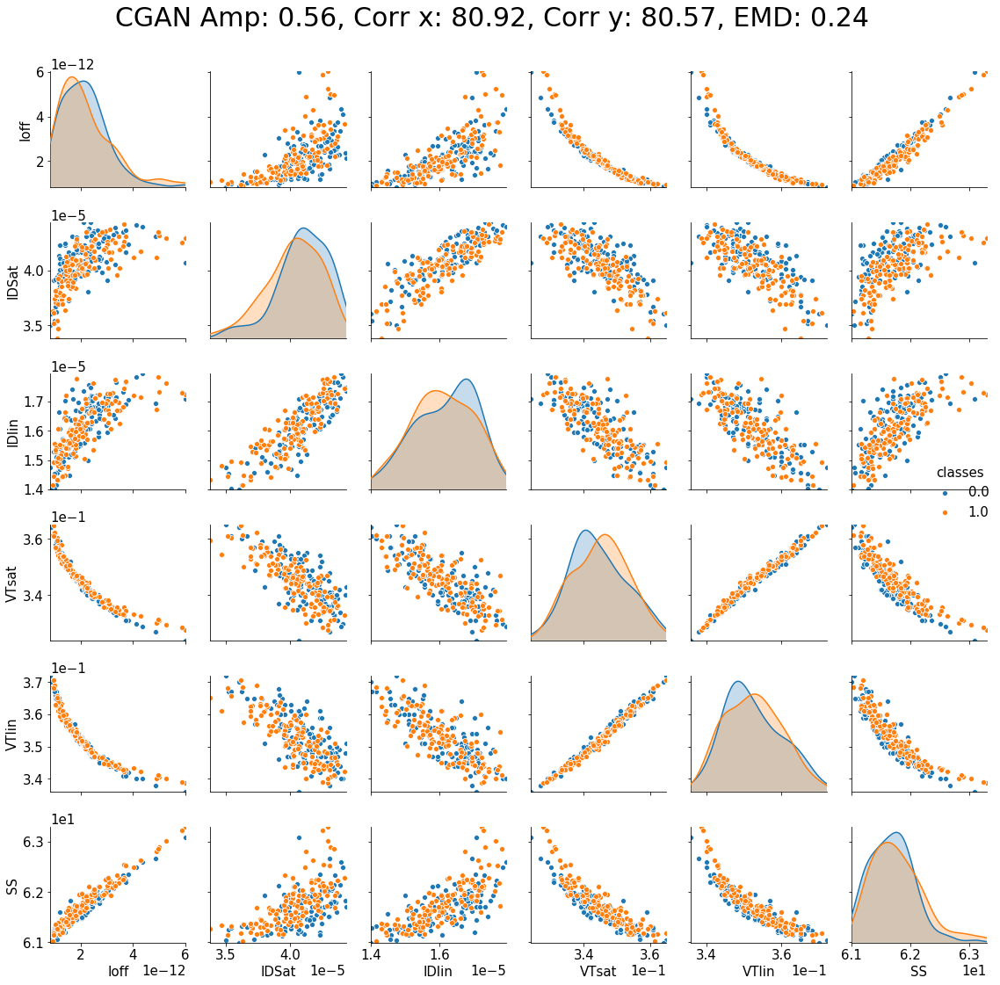

factor 2
250 375
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [7.18100000e-13 3.44300000e-05 1.42639743e-05 3.26000000e-01
 3.38000000e-01 6.10550000e+01 0.00000000e+00]
maximum y value for each varaible: [5.08200000e-12 4.49000882e-05 1.83700000e-05 3.68000000e-01
 3.74000000e-01 6.28665872e+01 1.00000000e+00]
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


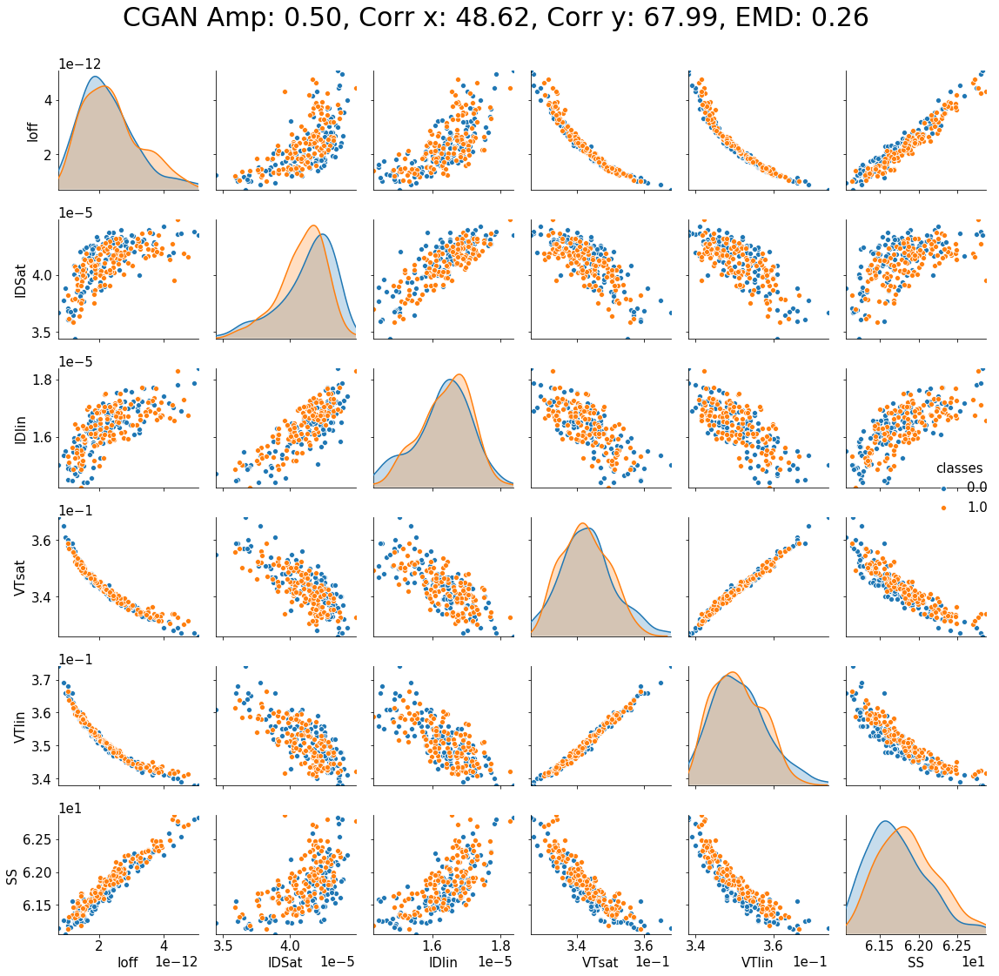

factor 3
375 500
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [5.98800000e-13 3.22190547e-05 1.32100000e-05 3.23757305e-01
 3.36702868e-01 6.08810000e+01 0.00000000e+00]
maximum y value for each varaible: [6.96282120e-12 4.44400000e-05 1.80100000e-05 3.72216091e-01
 3.79309215e-01 6.35672854e+01 1.00000000e+00]
X input [ 0.56045148 25.42868151 69.39740975  1.          0.        ]


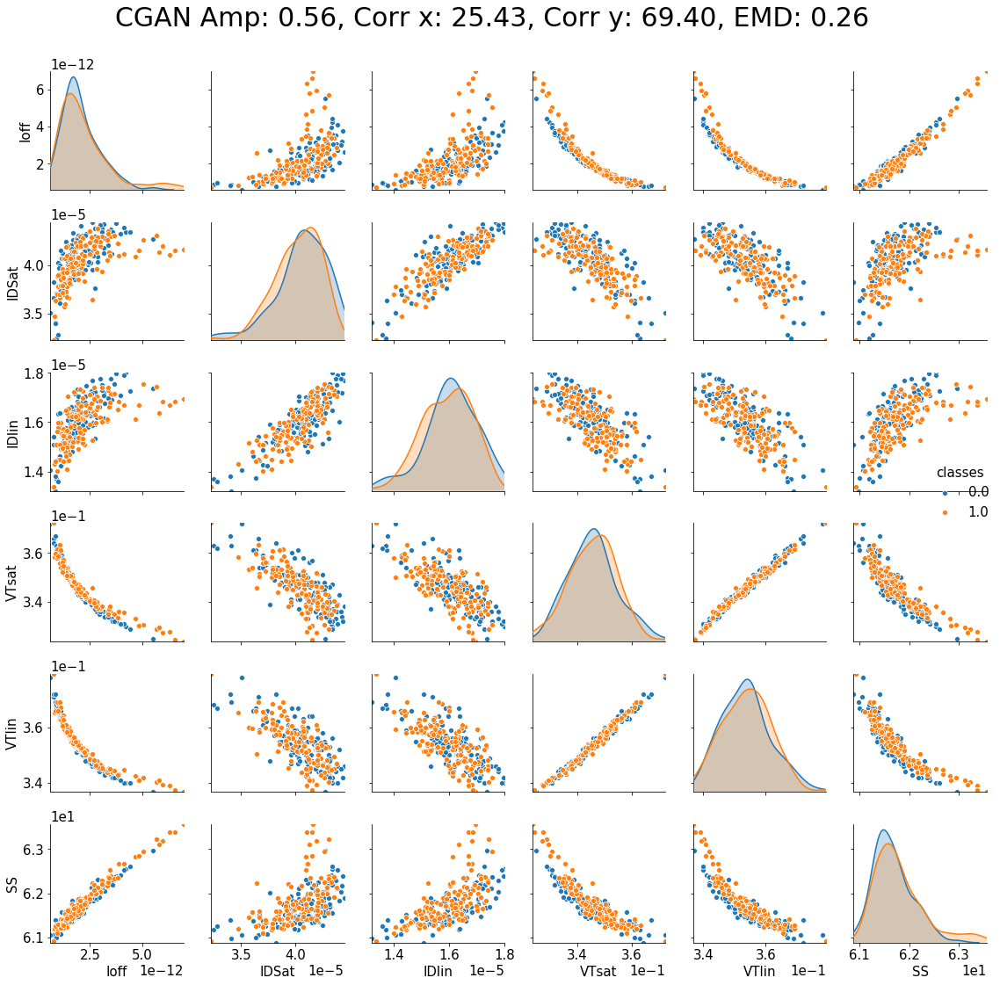

factor 4
500 625
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [6.73242283e-13 3.24972898e-05 1.29927382e-05 3.20547201e-01
 3.34479156e-01 6.08760000e+01 0.00000000e+00]
maximum y value for each varaible: [7.97410720e-12 4.47749600e-05 1.81500000e-05 3.72536375e-01
 3.78689771e-01 6.38405547e+01 1.00000000e+00]
X input [ 0.63730798 69.14860261 65.33037708  1.          0.        ]


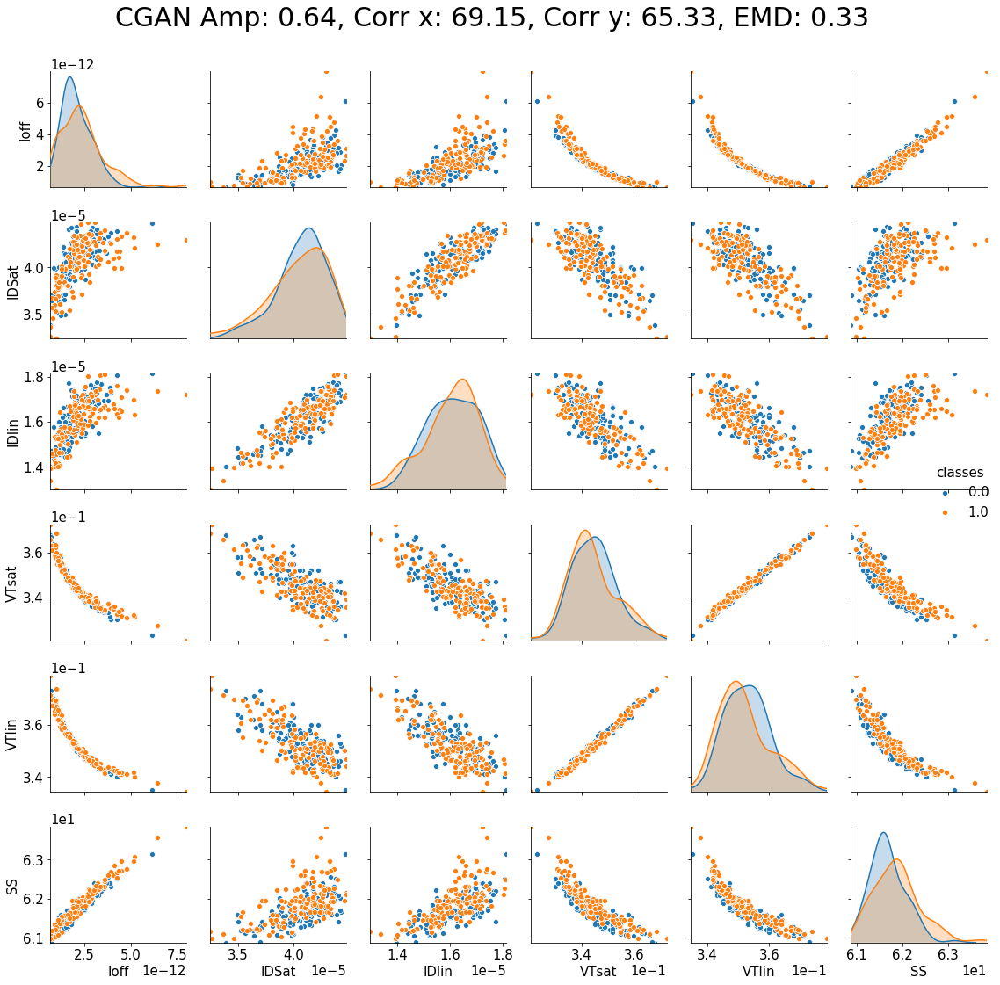

factor 5
625 750
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [4.38762645e-13 3.11277675e-05 1.26686227e-05 3.18000000e-01
 3.30000000e-01 6.09350000e+01 0.00000000e+00]
maximum y value for each varaible: [8.33700000e-12 4.59000000e-05 1.86000000e-05 3.74326415e-01
 3.77794859e-01 6.38930000e+01 1.00000000e+00]
X input [  0.72951307  89.39156879 205.62484728   1.           0.        ]


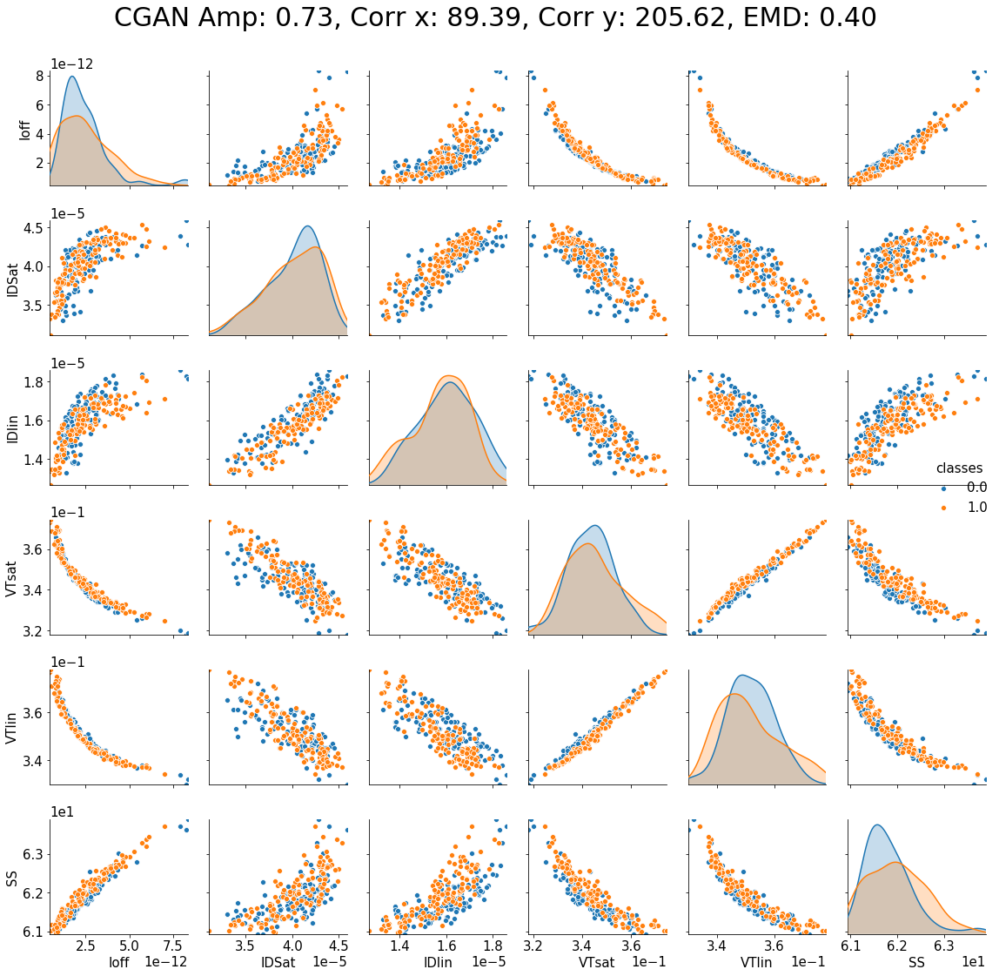

factor 6
750 875
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [1.66417410e-12 4.12100000e-05 1.58400000e-05 3.35563320e-01
 3.43887788e-01 6.13730000e+01 0.00000000e+00]
maximum y value for each varaible: [3.00006864e-12 4.39300000e-05 1.73375904e-05 3.47474005e-01
 3.54000000e-01 6.20528060e+01 1.00000000e+00]
X input [ 0.15273618 23.32639122 51.25326965  1.          0.        ]


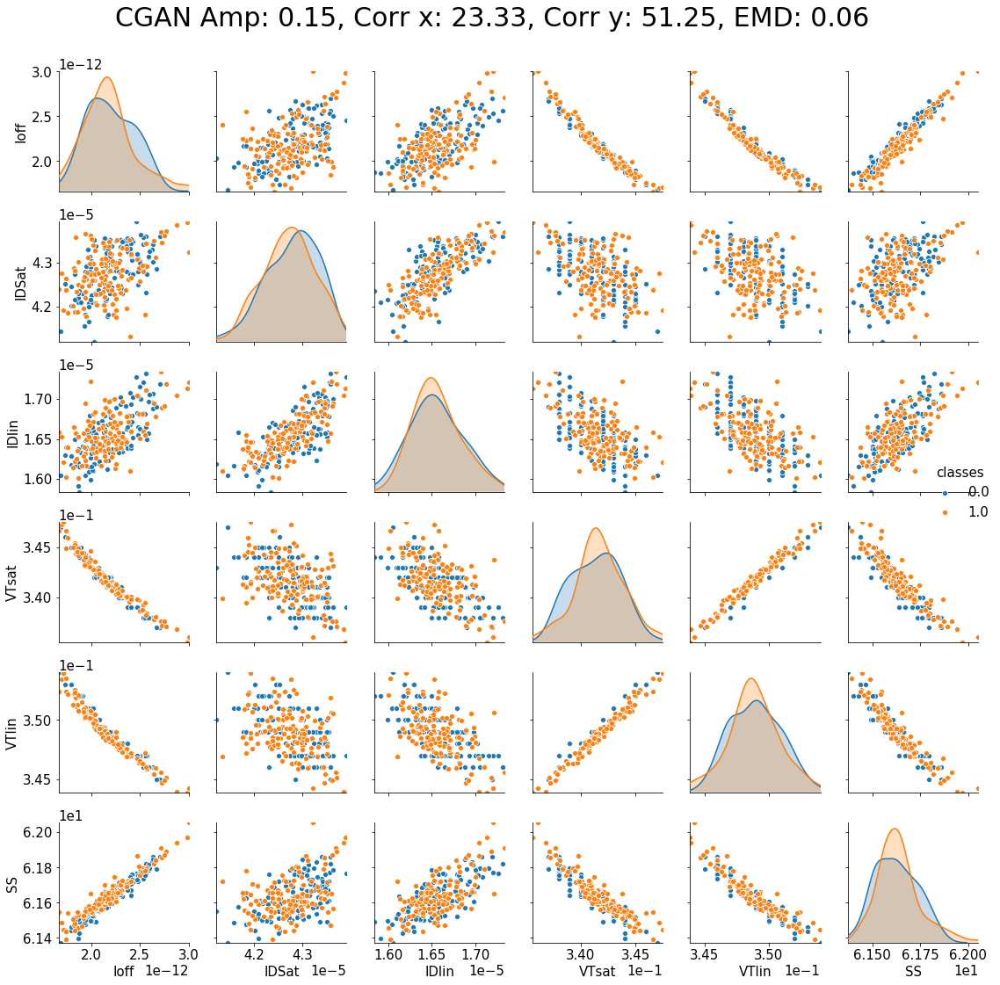

factor 7
875 1000
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [6.67800000e-13 2.91093188e-05 1.28400000e-05 3.23000000e-01
 3.35000000e-01 6.09080000e+01 0.00000000e+00]
maximum y value for each varaible: [7.52863098e-12 4.56800000e-05 1.87500000e-05 3.71000000e-01
 3.76000000e-01 6.39026715e+01 1.00000000e+00]
X input [ 0.68988283 85.08858437 80.98368203  1.          0.        ]


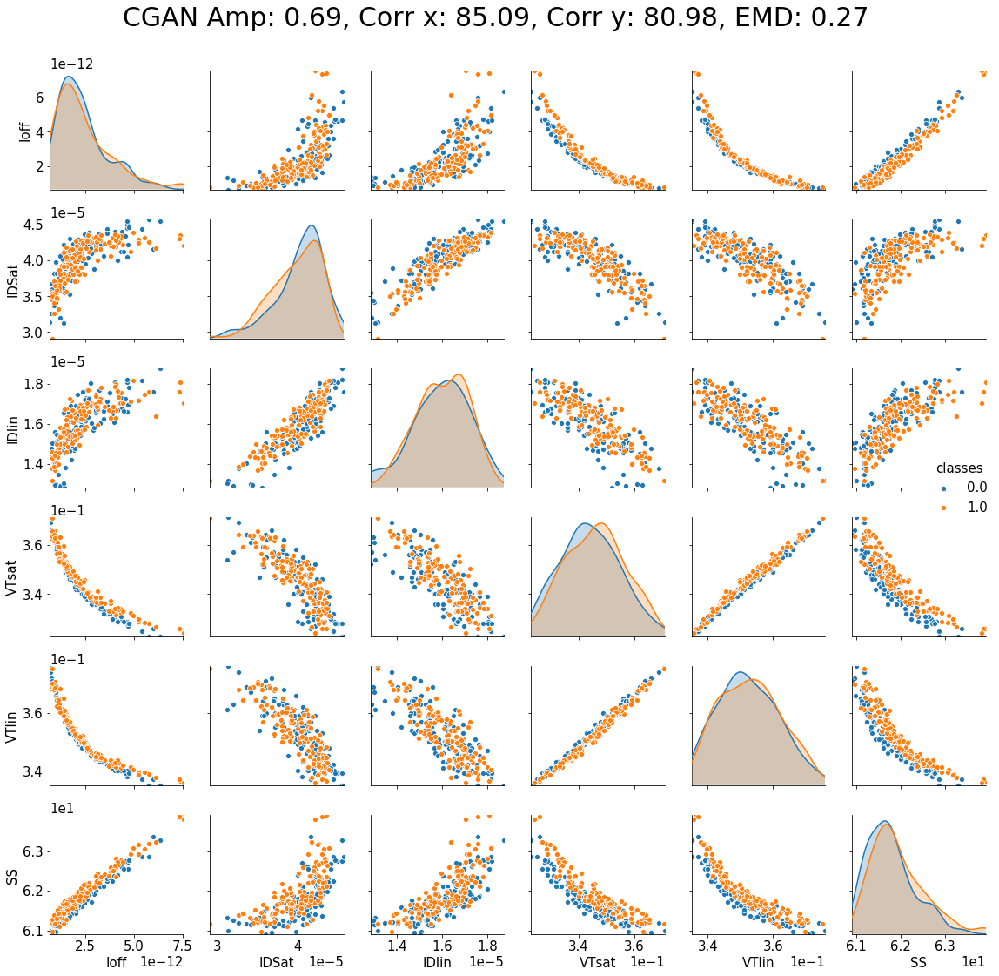

factor 8
1000 1125
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [1.46300000e-12 3.94679378e-05 1.53400000e-05 3.33000000e-01
 3.42000000e-01 6.12830000e+01 0.00000000e+00]
maximum y value for each varaible: [3.48000000e-12 4.45600000e-05 1.74400000e-05 3.50334653e-01
 3.57000000e-01 6.21800000e+01 1.00000000e+00]
X input [ 0.25925637 78.12653757 28.08679576  1.          0.        ]


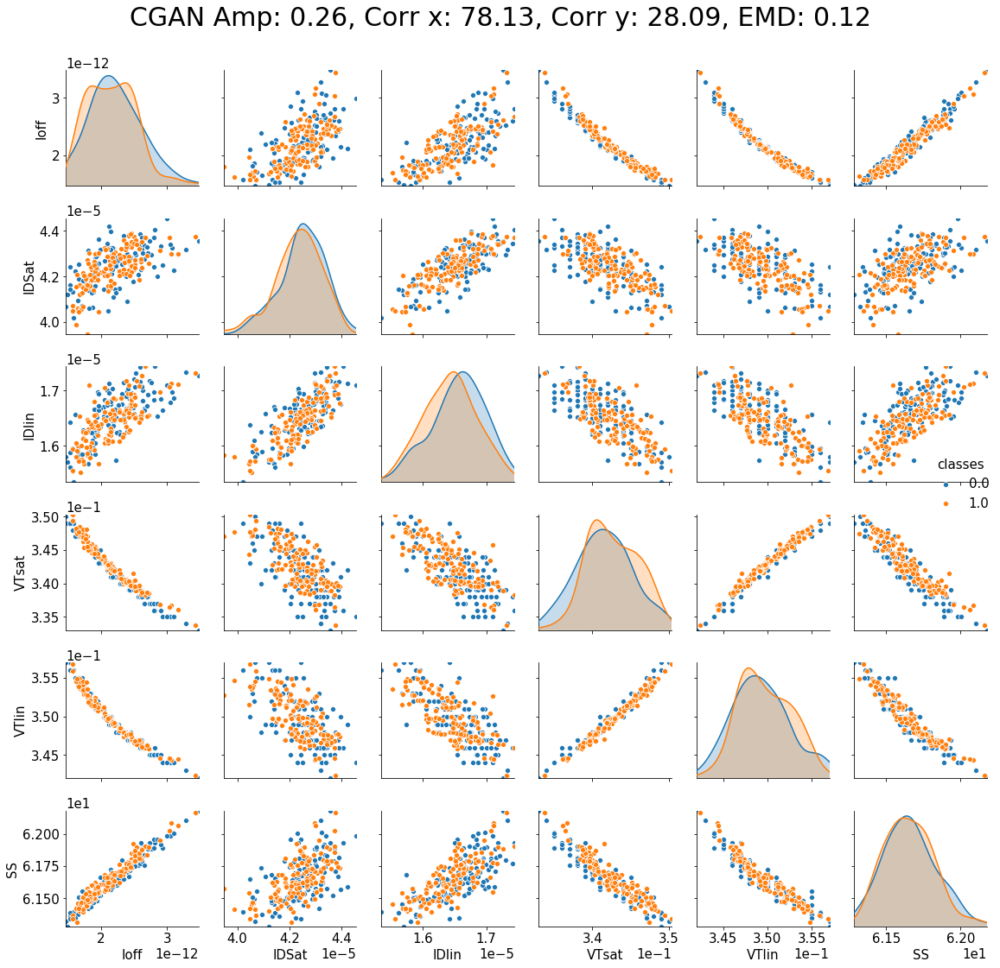

factor 9
1125 1250
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [1.56600000e-12 4.15821937e-05 1.56654668e-05 3.35967969e-01
 3.44000000e-01 6.13720000e+01 0.00000000e+00]
maximum y value for each varaible: [2.91813313e-12 4.44300000e-05 1.72600000e-05 3.49000000e-01
 3.55000000e-01 6.19625500e+01 1.00000000e+00]
X input [1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]


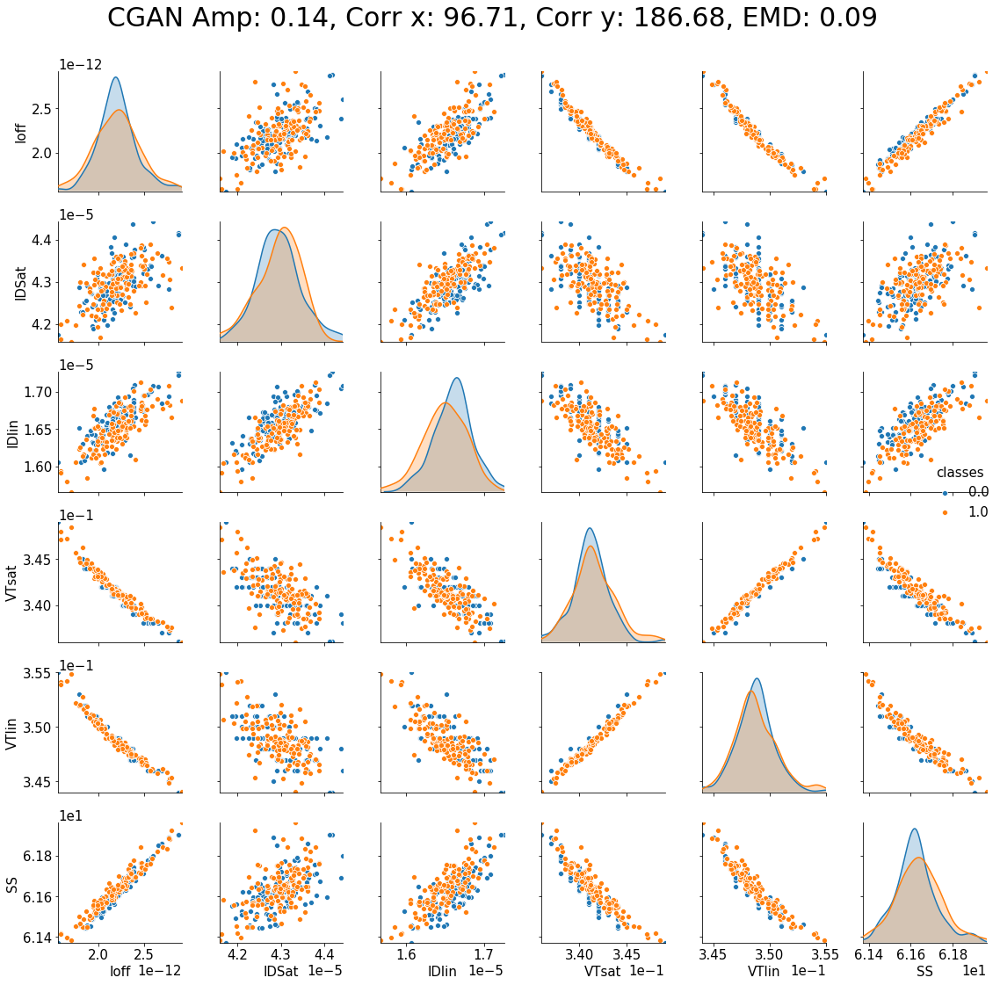

In [59]:
# gen_factor = 7
# test_sample_num = int(total_result_test.shape[0]/15)
# test_gan_matrix_plot = total_result_test[gen_factor * test_sample_num:(gen_factor+1)*test_sample_num]

for factor in range(num_of_cycle):
    
    print("factor", factor)

    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    print(sum(num_in_cycle_half[:factor]),sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor])
    test_gan_matrix_plot = test_gen[factor * test_gen_sample_num:(factor+1)*test_gen_sample_num]
    print("Generated sample shape:", test_gan_matrix_plot.shape)

    # real sample
    test_real_matrix_plot = A_test_real[sum(num_in_cycle_half[:factor]):sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor]]
    print("real sample shape:", test_real_matrix_plot.shape)
    print()

    # Assigning class(generated: 0, real:1 ) for visualization

    print("Assigning class for visualization (generated: 0, real:1 )")

    test_gan_cls = np.ones((test_gen_sample_num, 1))
    print("generated sample class shape:", test_gan_cls.shape)
    test_real_cls = np.zeros((num_in_cycle_half[factor], 1))
    print("real sample class shape:", test_real_cls.shape)

    test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)

#    print(df1_test)
    
        # min, max for generated Y value ( used for scatter plot limit standard )

    test_min_list = total_test_matrix_plot.min(axis=0)
    test_max_list = total_test_matrix_plot.max(axis=0)
    print("minimum y value for each varaible:", test_min_list)
    print("maximum y value for each varaible:", test_max_list)

    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.2f}, Corr x: {:.2f}, Corr y: {:.2f}, EMD: {:.2f}".format(X_test[0], X_test[1], X_test[2], EMD_score_list_integral[factor]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((test_min_list[i],test_max_list[i]))
        g.axes[i,i].set_ylim((test_min_list[i],test_max_list[i]))

    for ax in g.axes.flatten():
        ax.ticklabel_format(style='sci', scilimits=(0,0), axis='both')

    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.savefig('figures/Gen_Test_Custom_factor_{}_sample_{}_seed_990_9226_a.pdf'.format(factor, test_gen_sample_num), bbox_inches='tight', transparent=True, pad_inches=0)
    plt.show()


    ### 파란색이 real 주황색이 generated

# 2. Same scale

factor 0
0 125
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [  0.62484672  17.00743225 173.85718891   1.           0.        ]


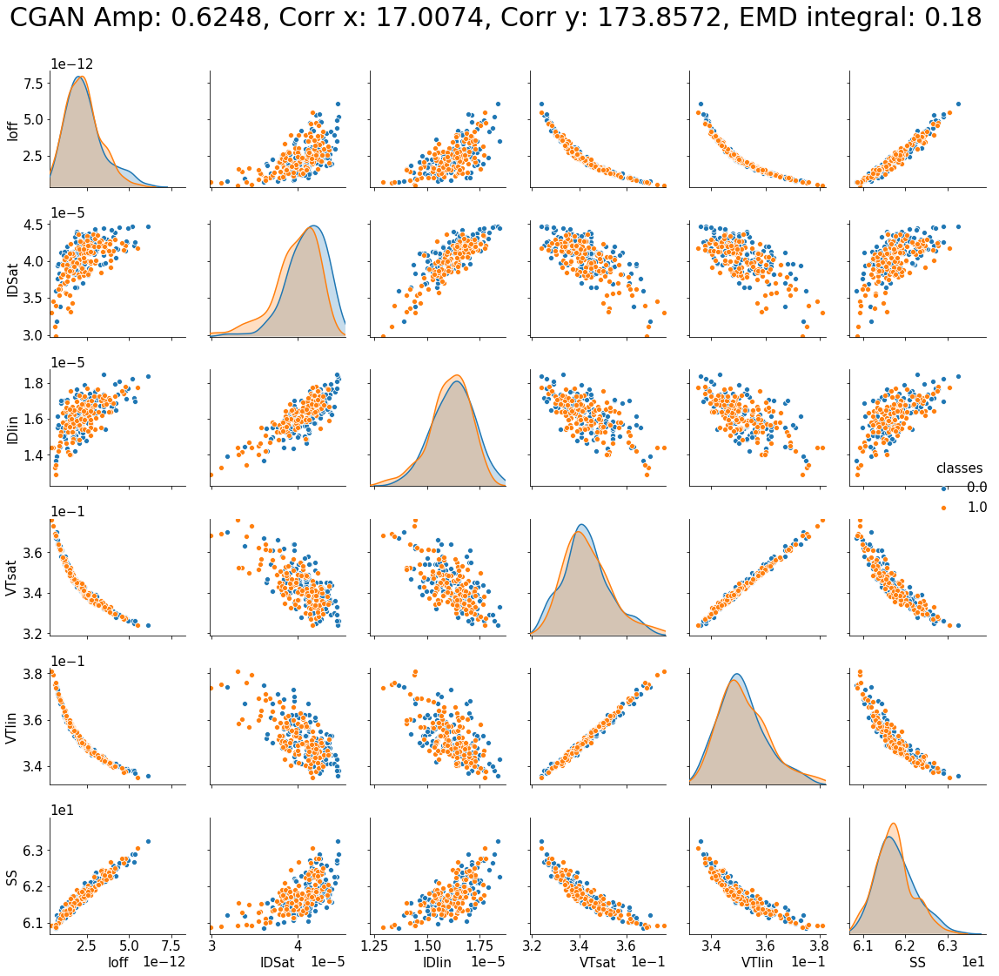

factor 1
125 250
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.55654727 80.91905766 80.56986979  1.          0.        ]


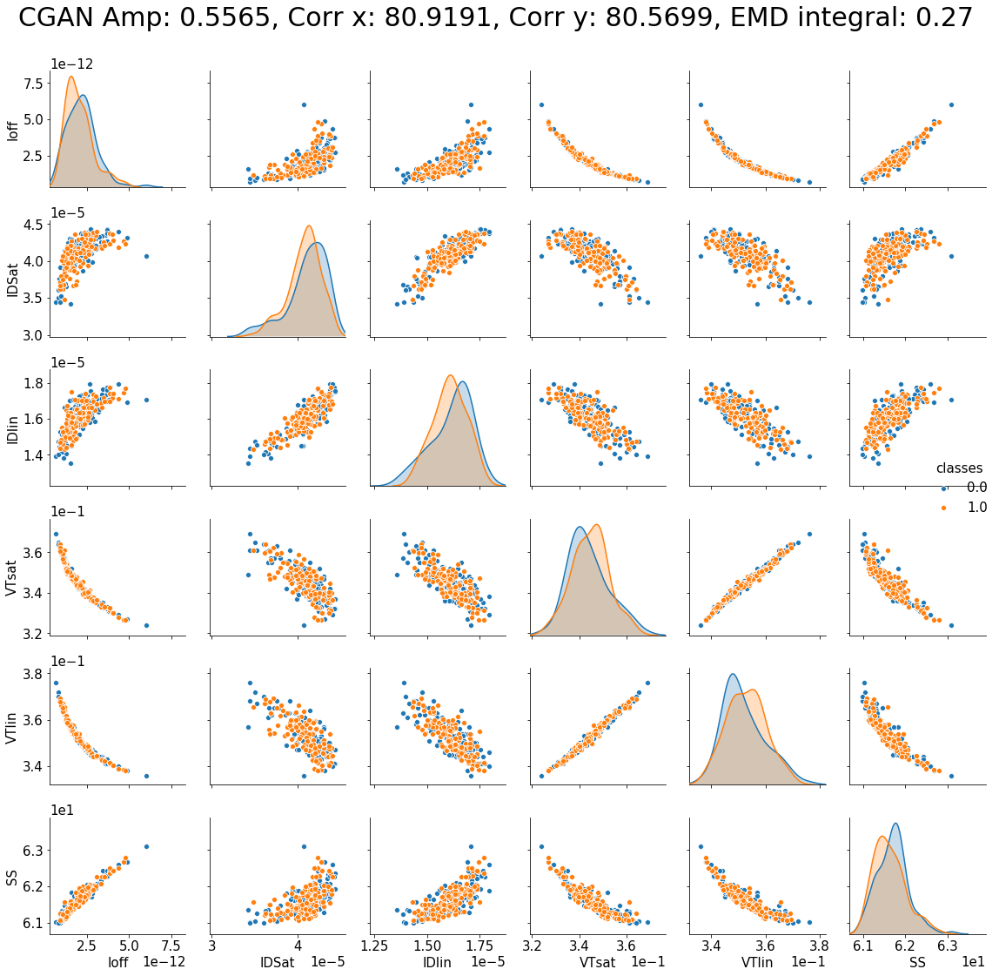

factor 2
250 375
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


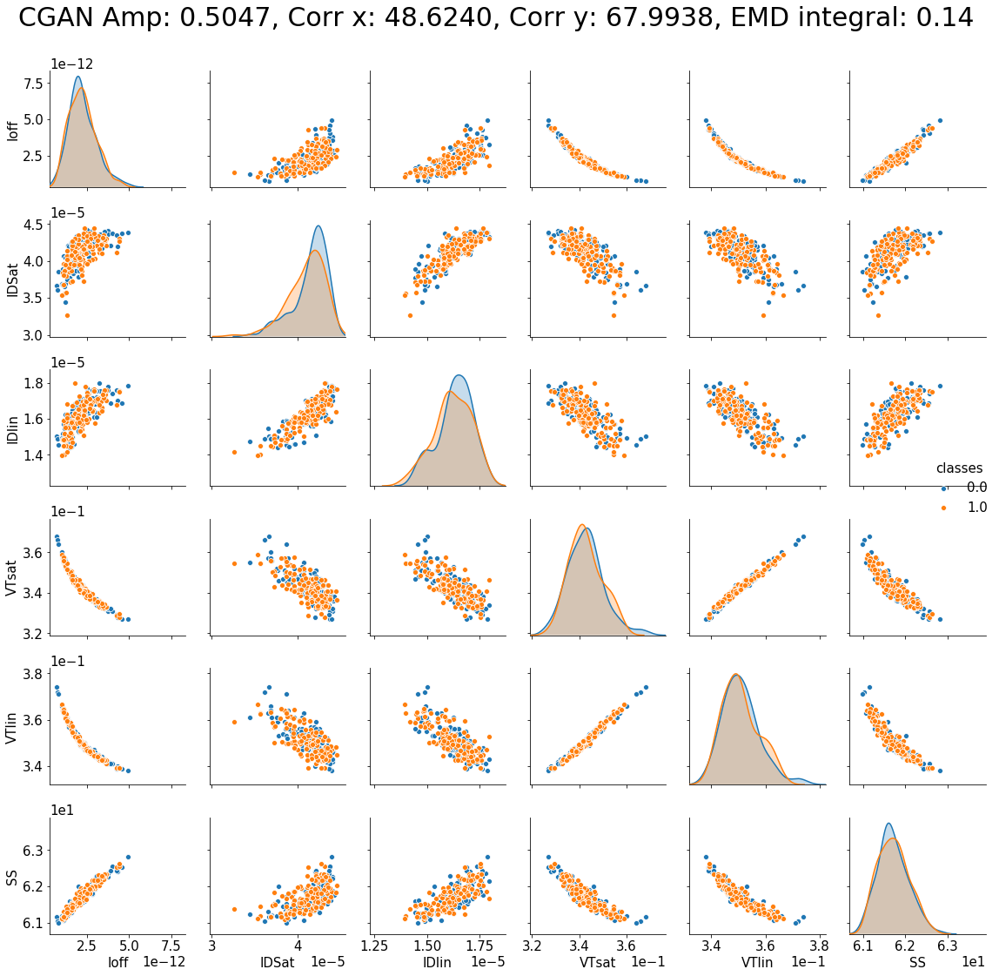

factor 3
375 500
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.56045148 25.42868151 69.39740975  1.          0.        ]


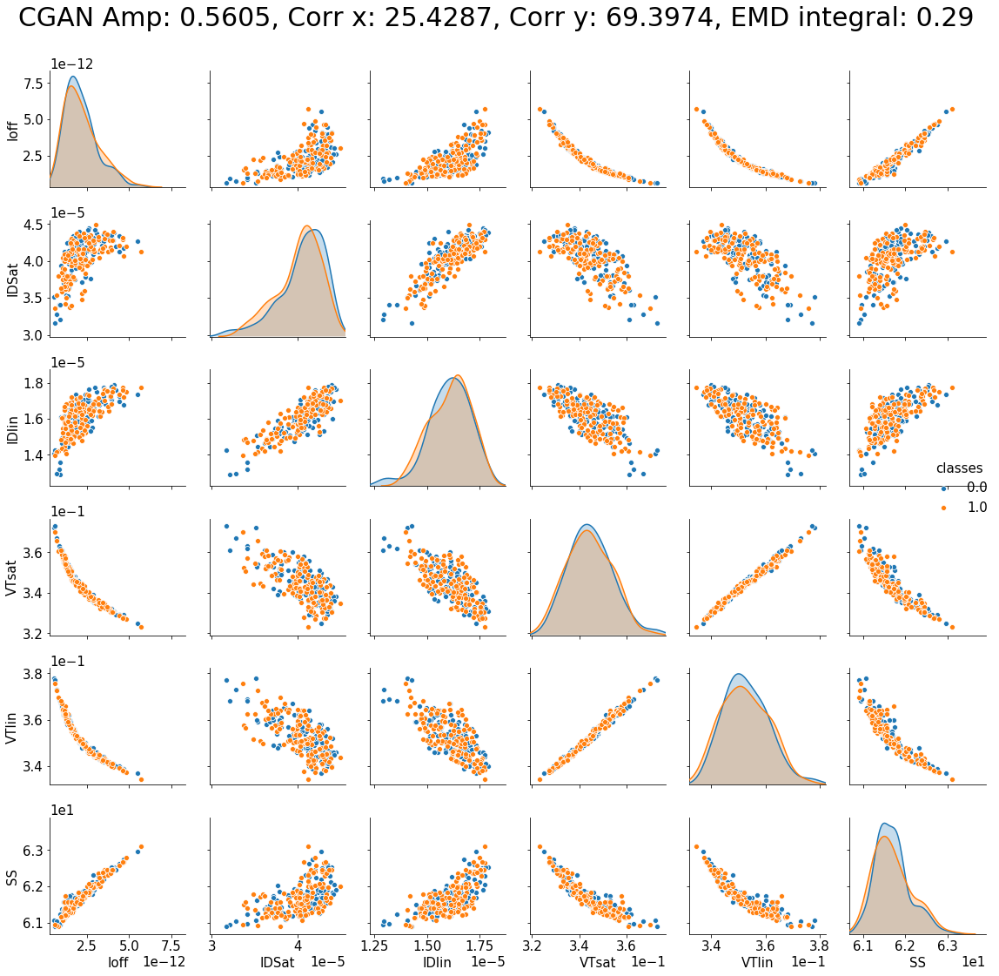

factor 4
500 625
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.63730798 69.14860261 65.33037708  1.          0.        ]


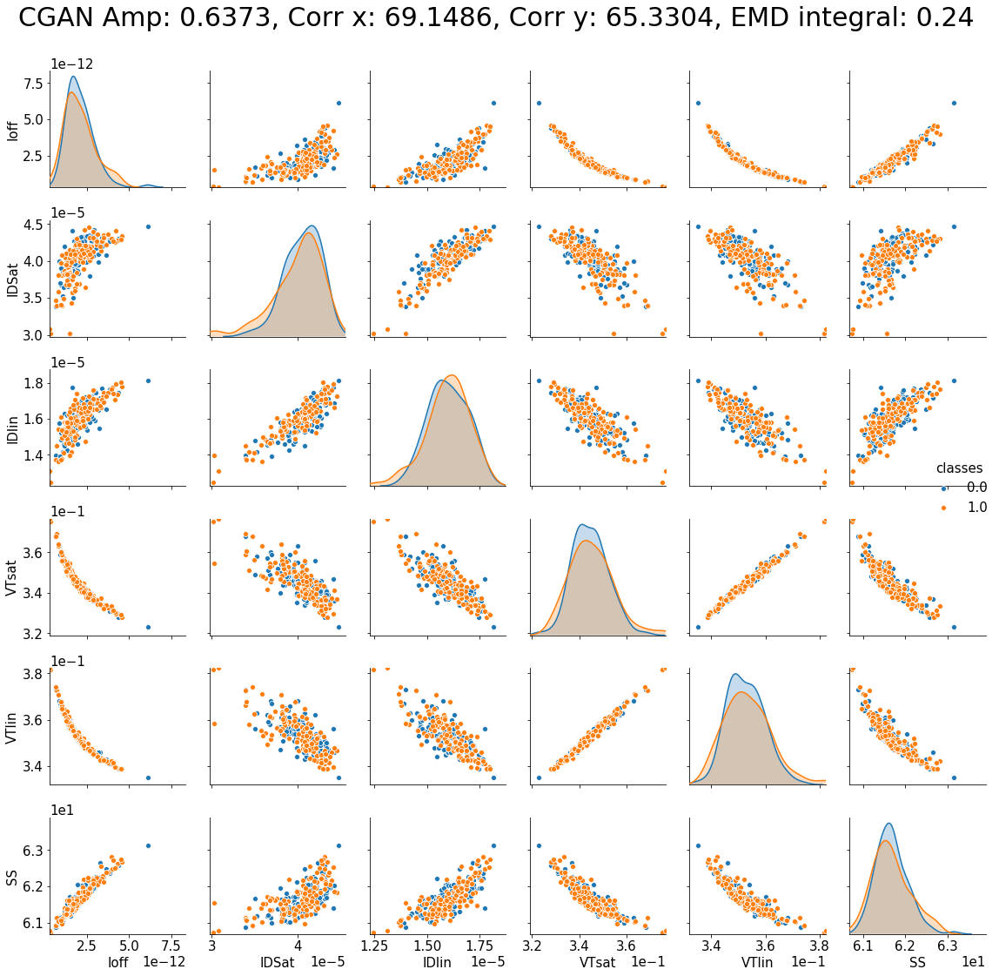

factor 5
625 750
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [  0.72951307  89.39156879 205.62484728   1.           0.        ]


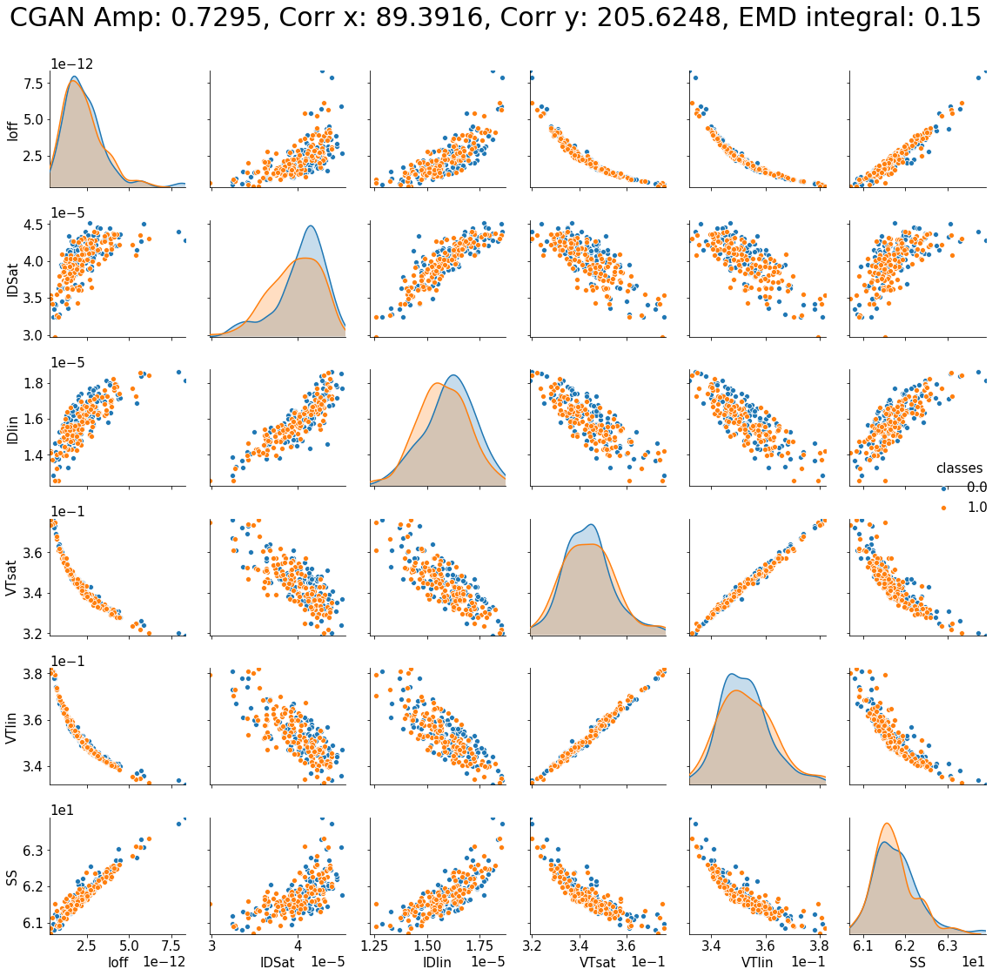

factor 6
750 875
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.15273618 23.32639122 51.25326965  1.          0.        ]


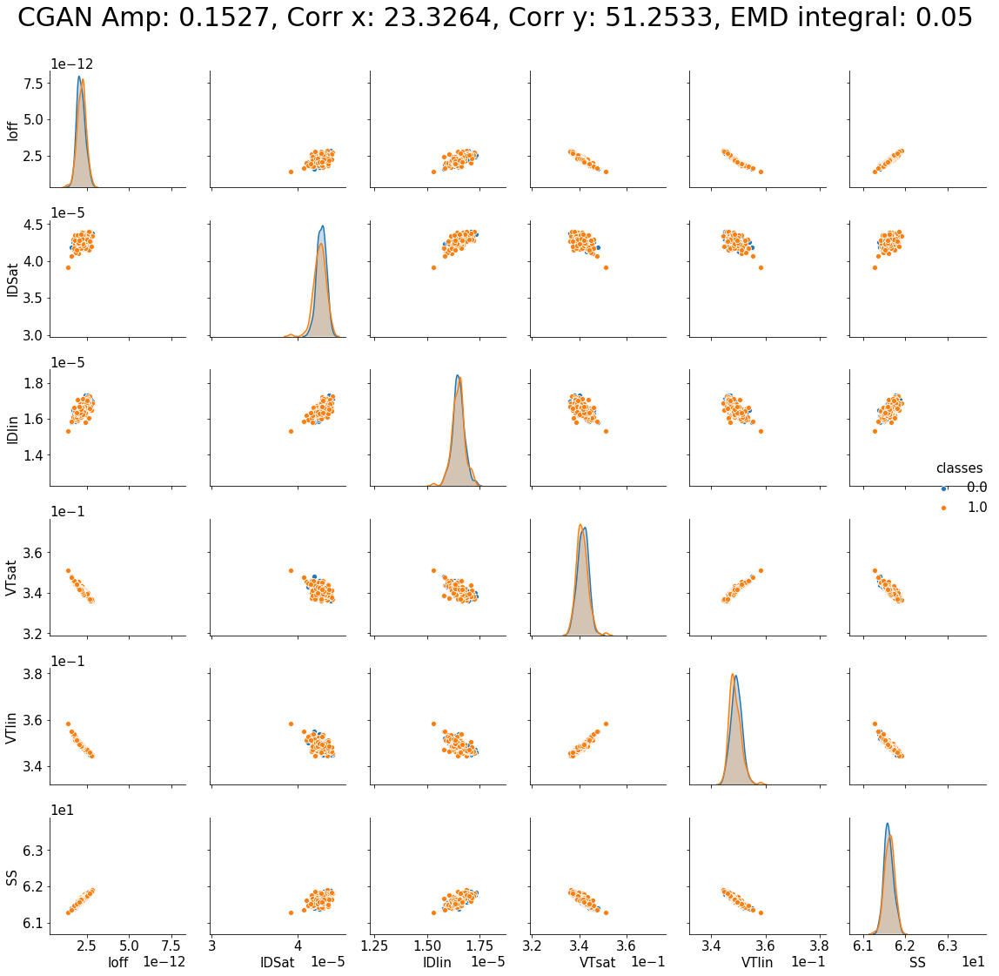

factor 7
875 1000
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.68988283 85.08858437 80.98368203  1.          0.        ]


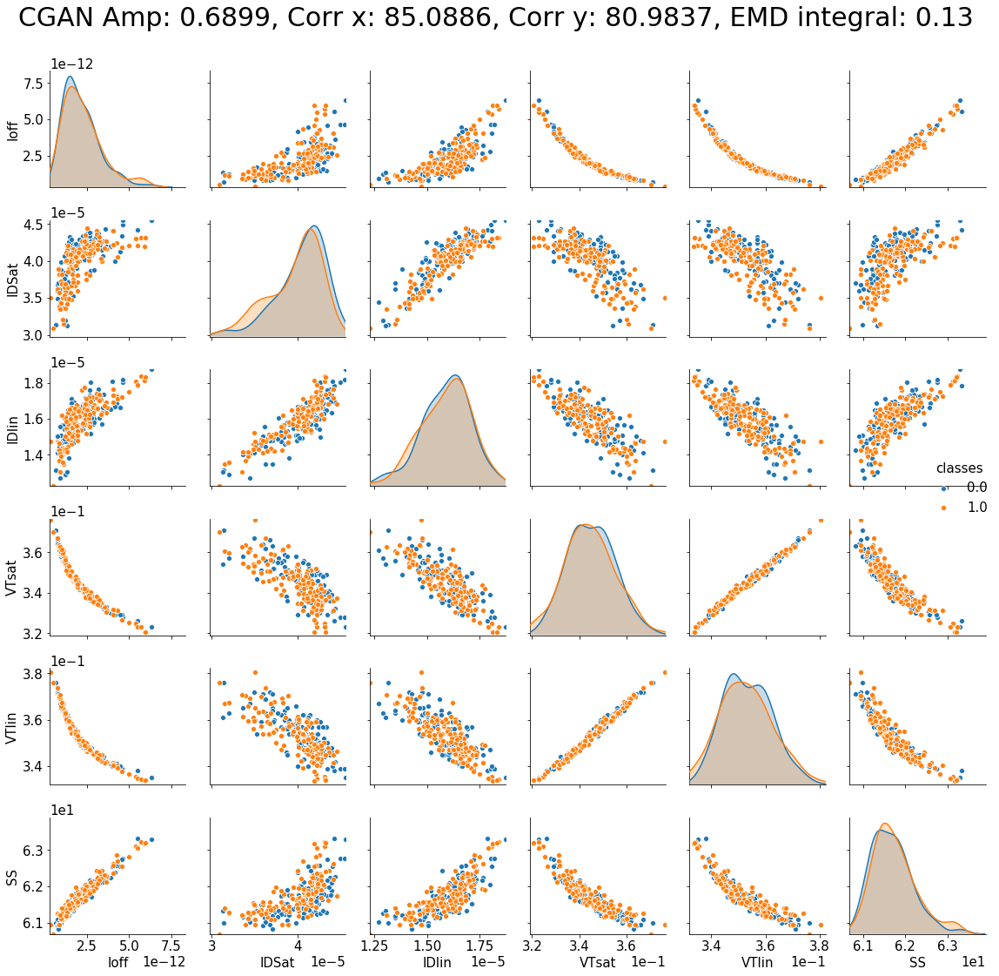

factor 8
1000 1125
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.25925637 78.12653757 28.08679576  1.          0.        ]


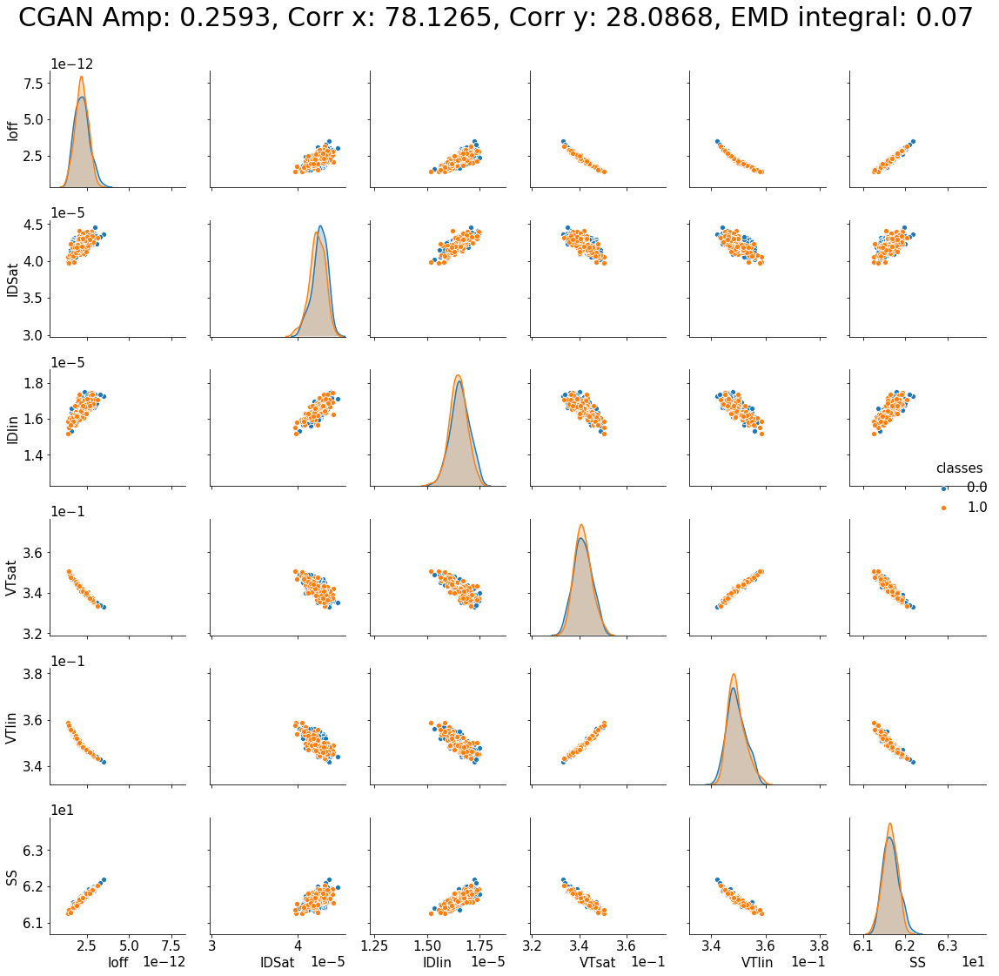

factor 9
1125 1250
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]


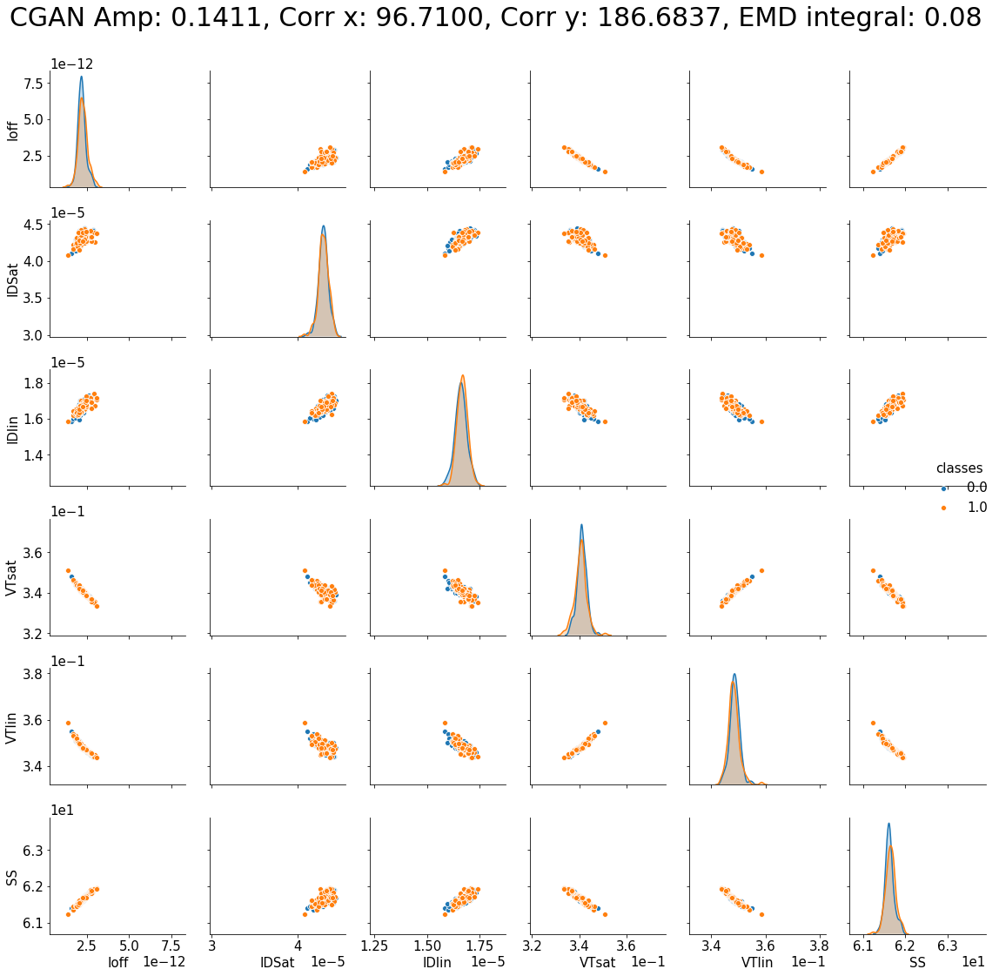

In [242]:
for factor in range(num_of_cycle):
    
    print("factor", factor)

    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    print(sum(num_in_cycle_half[:factor]),sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor])
    test_gan_matrix_plot = test_gen[factor * test_gen_sample_num:(factor+1)*test_gen_sample_num]
    print("Generated sample shape:", test_gan_matrix_plot.shape)

    # real sample
    test_real_matrix_plot = A_test_real[sum(num_in_cycle_half[:factor]):sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor]]
    print("real sample shape:", test_real_matrix_plot.shape)
    print()

    # Assigning class(generated: 0, real:1 ) for visualization

    print("Assigning class for visualization (generated: 0, real:1 )")

    test_gan_cls = np.ones((test_gen_sample_num, 1))
    print("generated sample class shape:", test_gan_cls.shape)
    test_real_cls = np.zeros((num_in_cycle_half[factor], 1))
    print("real sample class shape:", test_real_cls.shape)

    test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)
    
#     print(np.min(test_min_list))
#     print(np.max(test_max_list, axis=1))
    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.4f}, Corr x: {:.4f}, Corr y: {:.4f}, EMD integral: {:.2f}".format(X_test[0], X_test[1], X_test[2], EMD_score_list_integral[factor]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((min_per_out_v[i], max_per_out_v[i]))
        g.axes[i,i].set_ylim((min_per_out_v[i], max_per_out_v[i]))
    
    for ax in g.axes.flatten():
        ax.ticklabel_format(style='sci', scilimits=(0,0), axis='both')
    
    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.savefig('figures/Gen_Test_same_factor_{}_sample_{}_seed_990_9226_b.pdf'.format(factor, test_gen_sample_num), bbox_inches='tight', transparent=True, pad_inches=0)
    plt.show()
    
    ### 파란색이 real 주황색이 generated

# STEP 2. GEN, REAL 250개씩 비교

# GENERATED DATA
### Please put your sampled data file(in .npy) in the same directory

In [373]:
########################################  CHANGE HERE ####################################################################

result = 'test_specificdate_210118_data_2020_LER_20201008_V008.xlsx_model_mlp_constant_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_200_50_batch_size_32_noise_d_500_sample_num_250_tr_num_in_cycle_50_pdrop_0.5.npy'

# additive : test_specificdate_210118_data_2020_LER_20201008_V008.xlsx_model_mlp_constant_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_200_50_batch_size_32_noise_d_500_sample_num_250_tr_num_in_cycle_50_pdrop_0.5.npy
# naive : 'test_specificnaive_date_210130_data_2020_LER_20201008_V008.xlsx_model_mlp_gan1_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_noise_d_100_sample_num_250_tr_num_in_cycle_50_pdrop_0.9.npy'


##########################################################################################################################

test_gen = np.load(result, allow_pickle=True)

num_of_cycle = 10


test_gen_sample_num = int(test_gen.shape[0]/num_of_cycle)

print("test data sample num", test_gen_sample_num)
print("test data shape", test_gen.shape)


test data sample num 250
test data shape (2500, 6)


In [374]:
min1_per_out_v = test_real.min(axis=0)
max1_per_out_v = test_gen.max(axis=0)
print("minimum y value for each varaible:", min1_per_out_v)
print("maximum y value for each varaible:", max1_per_out_v)

min2_per_out_v = test_real.min(axis=0)
max2_per_out_v = test_real.max(axis=0)
print("minimum y value for each varaible:", min2_per_out_v)
print("maximum y value for each varaible:", max2_per_out_v)

min_per_out_v = np.minimum(min1_per_out_v, min2_per_out_v)
max_per_out_v = np.maximum(max1_per_out_v, max2_per_out_v)


minimum y value for each varaible: [3.0220e-13 2.6090e-05 1.1500e-05 3.1800e-01 3.3000e-01 6.0765e+01]
maximum y value for each varaible: [7.19017451e-12 4.57758321e-05 1.81853349e-05 3.82073529e-01
 3.89038448e-01 6.34172942e+01]
minimum y value for each varaible: [3.0220e-13 2.6090e-05 1.1500e-05 3.1800e-01 3.3000e-01 6.0765e+01]
maximum y value for each varaible: [8.3370e-12 4.5900e-05 1.8750e-05 3.9400e-01 3.9700e-01 6.3893e+01]


In [375]:
# EMD  

EMD_1d_score_list, EMD_2d_score_list = sample_utils.EMD_all_pair_each_X_integral(generated_samples = test_real, real_samples = test_gen, num_coordinate=10, num_of_cycle=num_of_cycle, num_in_gen_list=num_in_cycle, num_in_real_list = num_in_cycle, min_list = min_per_out_v, max_list = max_per_out_v) 

print(EMD_1d_score_list.shape)
print(EMD_2d_score_list.shape)

EMD_score_cat = np.hstack((EMD_1d_score_list, EMD_2d_score_list))

EMD_score = np.mean(EMD_score_cat)
EMD_score_list_integral = np.mean(EMD_score_cat,axis=1)
EMD_std = np.sqrt(np.mean((EMD_score - EMD_score_list_integral)**2))

for i in range(len(EMD_score_list_integral)):
    print("EMD_score for each X factor {} \t score {:5f} \t dev {:5f}".format(i, EMD_score_list_integral[i], (EMD_score_list_integral[i]-EMD_score)/EMD_std))
# A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classs

EMD_score_list = np.array(EMD_score_list_integral)
print("EMD score: ", EMD_score)

 
print("EMD argsort: ", EMD_score_list.argsort())

(10, 6)
(10, 15)
EMD_score for each X factor 0 	 score 0.177213 	 dev 0.085027
EMD_score for each X factor 1 	 score 0.274785 	 dev 1.463207
EMD_score for each X factor 2 	 score 0.174702 	 dev 0.049553
EMD_score for each X factor 3 	 score 0.123586 	 dev -0.672436
EMD_score for each X factor 4 	 score 0.201460 	 dev 0.427507
EMD_score for each X factor 5 	 score 0.195946 	 dev 0.349623
EMD_score for each X factor 6 	 score 0.056010 	 dev -1.626930
EMD_score for each X factor 7 	 score 0.288454 	 dev 1.656273
EMD_score for each X factor 8 	 score 0.132412 	 dev -0.547776
EMD_score for each X factor 9 	 score 0.087365 	 dev -1.184048
EMD score:  0.17119330736322821
EMD argsort:  [6 9 3 8 2 0 5 4 1 7]


In [ ]:
for factor in range(num_of_cycle):
    
    print("factor", factor)

    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    print(sum(num_in_cycle[:factor]),sum(num_in_cycle[:factor])+num_in_cycle[factor])
    test_gen_matrix_plot = test_gen[sum(num_in_cycle[:factor]):sum(num_in_cycle[:factor])+num_in_cycle[factor]]
    print("real sample shape:", test_gen_matrix_plot.shape)

    # real sample
    test_real_matrix_plot = test_real[sum(num_in_cycle[:factor]):sum(num_in_cycle[:factor])+num_in_cycle[factor]]
    print("test sample shape:", test_real_matrix_plot.shape)
    print()

    # Assigning class(real: 0, gen:1 ) for visualization

    print("Assigning class for visualization (real: 0, gen:1 )")

    test_gen_cls = np.ones((num_in_cycle[factor], 1))
    print("real A sample class shape:", test_gen_cls.shape)
    test_real_cls = np.zeros((num_in_cycle[factor], 1))
    print("real B sample class shape:", test_real_cls.shape)

    test_temp1 = np.hstack([test_gen_matrix_plot, test_gen_cls])
    test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)
    
#     print(np.min(test_min_list))
#     print(np.max(test_max_list, axis=1))
    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.4f}, Corr x: {:.4f}, Corr y: {:.4f}, EMD integral: {:.3f}".format(X_test[0], X_test[1], X_test[2], EMD_score_list_integral[factor]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((min_per_out_v[i], max_per_out_v[i]))
        g.axes[i,i].set_ylim((min_per_out_v[i], max_per_out_v[i]))
    
    for ax in g.axes.flatten():
        ax.ticklabel_format(style='sci', scilimits=(0,0), axis='both')
    
    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.savefig('figures/real_Test_same_factor_{}_sample_{}.pdf'.format(factor, test_gen_sample_num), bbox_inches='tight', transparent=True, pad_inches=0)
    plt.show()
    
    ### 파란색이 real 주황색이 generated

In [ ]:
# mean, std comutation

In [353]:

file_path = '2020_LER_20201102_testset_V04.xlsx'

true_seed_list = [990, 8277, 8904, 1199, 4128, 2922,  706, 8754, 2212, 7733]
gen_seed_list = [9226,  807,  524, 2646, 1638, 3741,  328, 7822, 9461, 8437]

result_A = []
result_B = []


for i in range(10):
    
    true_seed = true_seed_list[i]
    gen_seed = gen_seed_list[i]
    
    # True Data    
    
    name = '_seed_{}'.format(true_seed)

    # data_A

    data = np.load('../data_handler/'+file_path+'_data_a'+name+'.npy', allow_pickle=True)
    num_in_cycle_half = [125]*10
    num_of_cycle = 10

    A_X_all, A_Y_all, A_X_per_cycle, A_Y_per_cycle = np.array(data[0]), np.array(data[1]), np.array(data[2]), np.array(data[3])
    A_test_real = A_Y_all

    # for pair plot indexing
    A_test_X_cycle = A_X_per_cycle

    A_y_mean = np.mean(A_Y_all, axis=0, dtype=np.float32)
    A_y_std = np.std(A_Y_all, axis=0, dtype=np.float32)

    # data_B

    data = np.load('../data_handler/'+file_path+'_data_b'+name+'.npy', allow_pickle=True)

    B_X_all, B_Y_all, B_X_per_cycle, B_Y_per_cycle = np.array(data[0]), np.array(data[1]), np.array(data[2]), np.array(data[3])
    B_test_real = B_Y_all

    # for pair plot indexing
    B_test_X_cycle = B_X_per_cycle

    B_y_mean = np.mean(B_Y_all, axis=0, dtype=np.float32)
    B_y_std = np.std(B_Y_all, axis=0, dtype=np.float32)


    # Gen Data

    result = 'test_specificnaive_date_210130_data_2020_LER_20201008_V008.xlsx_model_mlp_gan1_seed_{}_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_noise_d_100_sample_num_125_tr_num_in_cycle_50_pdrop_0.9.npy'.format(gen_seed)

    test_gen = np.load(result, allow_pickle=True)

    num_of_cycle = 10

    test_gen_sample_num = int(test_gen.shape[0]/num_of_cycle)
    
    # A
    
    min1_per_out_v = A_test_real.min(axis=0)
    max1_per_out_v = A_test_real.max(axis=0)
    print("minimum y value for each varaible:", min1_per_out_v)
    print("maximum y value for each varaible:", max1_per_out_v)

    min2_per_out_v = test_gen.min(axis=0)
    max2_per_out_v = test_gen.max(axis=0)
    print("minimum y value for each varaible:", min2_per_out_v)
    print("maximum y value for each varaible:", max2_per_out_v)

    min_per_out_v = np.minimum(min1_per_out_v, min2_per_out_v)
    max_per_out_v = np.maximum(max1_per_out_v, max2_per_out_v)

    # EMD  

    EMD_1d_score_list, EMD_2d_score_list = sample_utils.EMD_all_pair_each_X_integral(generated_samples = test_gen, real_samples = A_test_real, num_coordinate=10, num_of_cycle=num_of_cycle, num_in_gen_list=[test_gen_sample_num]*num_of_cycle, num_in_real_list = num_in_cycle_half, min_list = min_per_out_v, max_list = max_per_out_v) 

    print(EMD_1d_score_list.shape)
    print(EMD_2d_score_list.shape)

    EMD_score_cat = np.hstack((EMD_1d_score_list, EMD_2d_score_list))

    EMD_score = np.mean(EMD_score_cat)
    EMD_score_list_integral = np.mean(EMD_score_cat,axis=1)
    EMD_std = np.sqrt(np.mean((EMD_score - EMD_score_list_integral)**2))

    result_A.append(EMD_score_list_integral)
    
    # B
    min1_per_out_v = B_test_real.min(axis=0)
    max1_per_out_v = B_test_real.max(axis=0)
    print("minimum y value for each varaible:", min1_per_out_v)
    print("maximum y value for each varaible:", max1_per_out_v)

    min2_per_out_v = test_gen.min(axis=0)
    max2_per_out_v = test_gen.max(axis=0)
    print("minimum y value for each varaible:", min2_per_out_v)
    print("maximum y value for each varaible:", max2_per_out_v)

    min_per_out_v = np.minimum(min1_per_out_v, min2_per_out_v)
    max_per_out_v = np.maximum(max1_per_out_v, max2_per_out_v)

    # EMD  

    EMD_1d_score_list, EMD_2d_score_list = sample_utils.EMD_all_pair_each_X_integral(generated_samples = test_gen, real_samples = B_test_real, num_coordinate=10, num_of_cycle=num_of_cycle, num_in_gen_list=[test_gen_sample_num]*num_of_cycle, num_in_real_list = num_in_cycle_half, min_list = min_per_out_v, max_list = max_per_out_v) 

    print(EMD_1d_score_list.shape)
    print(EMD_2d_score_list.shape)

    EMD_score_cat = np.hstack((EMD_1d_score_list, EMD_2d_score_list))

    EMD_score = np.mean(EMD_score_cat)
    EMD_score_list_integral = np.mean(EMD_score_cat,axis=1)
    EMD_std = np.sqrt(np.mean((EMD_score - EMD_score_list_integral)**2))

    result_B.append(EMD_score_list_integral)

    print(result_A)
    print(result_B)

minimum y value for each varaible: [5.2280e-13 3.1240e-05 1.2690e-05 3.1900e-01 3.3200e-01 6.0799e+01]
maximum y value for each varaible: [8.3370e-12 4.5520e-05 1.8750e-05 3.7600e-01 3.8100e-01 6.3893e+01]
minimum y value for each varaible: [3.22169752e-13 2.97672097e-05 1.22695943e-05 3.19973155e-01
 3.32721367e-01 6.06838808e+01]
maximum y value for each varaible: [6.14563458e-12 4.49361305e-05 1.85497985e-05 3.76531002e-01
 3.82135944e-01 6.33229194e+01]
(10, 6)
(10, 15)
minimum y value for each varaible: [3.0220e-13 2.6090e-05 1.1500e-05 3.1800e-01 3.3000e-01 6.0765e+01]
maximum y value for each varaible: [8.2640e-12 4.5900e-05 1.8520e-05 3.9400e-01 3.9700e-01 6.3635e+01]
minimum y value for each varaible: [3.22169752e-13 2.97672097e-05 1.22695943e-05 3.19973155e-01
 3.32721367e-01 6.06838808e+01]
maximum y value for each varaible: [6.14563458e-12 4.49361305e-05 1.85497985e-05 3.76531002e-01
 3.82135944e-01 6.33229194e+01]
(10, 6)
(10, 15)
[array([0.25645871, 0.27615268, 0.14659387

(10, 6)
(10, 15)
minimum y value for each varaible: [5.2280e-13 3.0710e-05 1.2240e-05 3.2000e-01 3.3400e-01 6.0765e+01]
maximum y value for each varaible: [7.8870e-12 4.5680e-05 1.8600e-05 3.7600e-01 3.8100e-01 6.3717e+01]
minimum y value for each varaible: [4.45201374e-15 2.74168989e-05 1.14131907e-05 3.20350663e-01
 3.33718960e-01 6.06037286e+01]
maximum y value for each varaible: [5.89448503e-12 4.48297484e-05 1.82553874e-05 3.84744559e-01
 3.89003212e-01 6.31427048e+01]
(10, 6)
(10, 15)
[array([0.25645871, 0.27615268, 0.14659387, 0.16944184, 0.22498276,
       0.26720391, 0.06880358, 0.21299666, 0.09004268, 0.07472255]), array([0.26215094, 0.19633269, 0.24320508, 0.18175479, 0.20795308,
       0.25744072, 0.11174715, 0.16096003, 0.15930055, 0.08546826]), array([0.29011087, 0.17735214, 0.23481806, 0.19399965, 0.24244636,
       0.22234615, 0.09236116, 0.24458101, 0.12365297, 0.0393997 ]), array([0.48589162, 0.38934279, 0.2341352 , 0.34502482, 0.19549447,
       0.18004137, 0.0549635

(10, 6)
(10, 15)
minimum y value for each varaible: [3.0220e-13 2.8040e-05 1.1500e-05 3.1800e-01 3.3000e-01 6.0799e+01]
maximum y value for each varaible: [8.2640e-12 4.5900e-05 1.8750e-05 3.9400e-01 3.9700e-01 6.3717e+01]
minimum y value for each varaible: [3.60528952e-13 2.94157506e-05 1.25170595e-05 3.20704300e-01
 3.32657104e-01 6.08487147e+01]
maximum y value for each varaible: [6.00613787e-12 4.49007277e-05 1.83938085e-05 3.76219916e-01
 3.81659040e-01 6.32237334e+01]
(10, 6)
(10, 15)
[array([0.25645871, 0.27615268, 0.14659387, 0.16944184, 0.22498276,
       0.26720391, 0.06880358, 0.21299666, 0.09004268, 0.07472255]), array([0.26215094, 0.19633269, 0.24320508, 0.18175479, 0.20795308,
       0.25744072, 0.11174715, 0.16096003, 0.15930055, 0.08546826]), array([0.29011087, 0.17735214, 0.23481806, 0.19399965, 0.24244636,
       0.22234615, 0.09236116, 0.24458101, 0.12365297, 0.0393997 ]), array([0.48589162, 0.38934279, 0.2341352 , 0.34502482, 0.19549447,
       0.18004137, 0.0549635

In [356]:
np.mean(result_A, axis=0)

array([0.29776422, 0.2588727 , 0.25988063, 0.23032721, 0.27296393,
       0.24106199, 0.07556681, 0.21700766, 0.11730099, 0.06495797])

In [357]:
np.std(result_A, axis=0)

array([0.08014016, 0.09452398, 0.09145425, 0.05934566, 0.06529278,
       0.05026537, 0.019608  , 0.03723195, 0.03490602, 0.01698752])

In [358]:
np.mean(result_B, axis=0)

array([0.25921291, 0.27239419, 0.20844858, 0.27956621, 0.26984092,
       0.25034666, 0.07822358, 0.2042075 , 0.13236328, 0.09367151])

In [359]:
np.std(result_B, axis=0)

array([0.03813095, 0.12647462, 0.04108436, 0.05325008, 0.06687241,
       0.08733122, 0.01441049, 0.05759813, 0.0402824 , 0.03198039])

In [368]:
file_path = '2020_LER_20201102_testset_V04.xlsx'

gen_seed_list = [9226,  807,  524, 2646, 1638, 3741,  328, 7822, 9461, 8437]

result_total = []

for i in range(10):
    
    gen_seed = gen_seed_list[i]
    
    # True Data    
    
    file_path = '2020_LER_20201102_testset_V04.xlsx'

    data = np.load('../data_handler/'+file_path+'.npy', allow_pickle=True)
    num_in_cycle = [250]*10
    num_of_cycle = 10

    X_all, Y_all, X_per_cycle, Y_per_cycle = data[0], data[1], data[2], data[3]
    test_real = Y_all

    # for pair plot indexing
    test_X_cycle = X_per_cycle

    y_mean = np.mean(Y_all, axis=0, dtype=np.float32)
    y_std = np.std(Y_all, axis=0, dtype=np.float32)

    # Gen Data

    result = 'test_specificnaive_date_210130_data_2020_LER_20201008_V008.xlsx_model_mlp_gan1_seed_{}_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_noise_d_100_sample_num_250_tr_num_in_cycle_50_pdrop_0.9.npy'.format(gen_seed)

    test_gen = np.load(result, allow_pickle=True)

    num_of_cycle = 10

    test_gen_sample_num = int(test_gen.shape[0]/num_of_cycle)
    
    min1_per_out_v = test_real.min(axis=0)
    max1_per_out_v = test_gen.max(axis=0)

    min2_per_out_v = test_real.min(axis=0)
    max2_per_out_v = test_real.max(axis=0)
    print("minimum y value for each varaible:", min2_per_out_v)
    print("maximum y value for each varaible:", max2_per_out_v)

    min_per_out_v = np.minimum(min1_per_out_v, min2_per_out_v)
    max_per_out_v = np.maximum(max1_per_out_v, max2_per_out_v)

    # EMD  

    EMD_1d_score_list, EMD_2d_score_list = sample_utils.EMD_all_pair_each_X_integral(generated_samples = test_real, real_samples = test_gen, num_coordinate=10, num_of_cycle=num_of_cycle, num_in_gen_list=num_in_cycle, num_in_real_list = num_in_cycle, min_list = min_per_out_v, max_list = max_per_out_v) 

    print(EMD_1d_score_list.shape)
    print(EMD_2d_score_list.shape)

    EMD_score_cat = np.hstack((EMD_1d_score_list, EMD_2d_score_list))

    EMD_score = np.mean(EMD_score_cat)
    EMD_score_list_integral = np.mean(EMD_score_cat,axis=1)
    EMD_std = np.sqrt(np.mean((EMD_score - EMD_score_list_integral)**2))
    
    
    result_total.append(EMD_score_list_integral)
    
    print(result_total)

minimum y value for each varaible: [3.0220e-13 2.6090e-05 1.1500e-05 3.1800e-01 3.3000e-01 6.0765e+01]
maximum y value for each varaible: [8.3370e-12 4.5900e-05 1.8750e-05 3.9400e-01 3.9700e-01 6.3893e+01]
(10, 6)
(10, 15)
[array([0.18439916, 0.21382714, 0.10864249, 0.21112561, 0.22330491,
       0.1922473 , 0.07554246, 0.12452957, 0.12658533, 0.06314984])]
minimum y value for each varaible: [3.0220e-13 2.6090e-05 1.1500e-05 3.1800e-01 3.3000e-01 6.0765e+01]
maximum y value for each varaible: [8.3370e-12 4.5900e-05 1.8750e-05 3.9400e-01 3.9700e-01 6.3893e+01]
(10, 6)
(10, 15)
[array([0.18439916, 0.21382714, 0.10864249, 0.21112561, 0.22330491,
       0.1922473 , 0.07554246, 0.12452957, 0.12658533, 0.06314984]), array([0.19931612, 0.15173138, 0.18605599, 0.20690617, 0.15383913,
       0.19396738, 0.07363627, 0.20698078, 0.12437553, 0.08056119])]
minimum y value for each varaible: [3.0220e-13 2.6090e-05 1.1500e-05 3.1800e-01 3.3000e-01 6.0765e+01]
maximum y value for each varaible: [8.337

(10, 6)
(10, 15)
[array([0.18439916, 0.21382714, 0.10864249, 0.21112561, 0.22330491,
       0.1922473 , 0.07554246, 0.12452957, 0.12658533, 0.06314984]), array([0.19931612, 0.15173138, 0.18605599, 0.20690617, 0.15383913,
       0.19396738, 0.07363627, 0.20698078, 0.12437553, 0.08056119]), array([0.17892553, 0.13752795, 0.21644599, 0.21285333, 0.25766709,
       0.16392189, 0.07019007, 0.1609463 , 0.12273384, 0.06199509]), array([0.30438676, 0.1987845 , 0.16648474, 0.23551297, 0.2533898 ,
       0.19758338, 0.06680999, 0.17324429, 0.1204993 , 0.06316983]), array([0.20899319, 0.15175801, 0.2221319 , 0.19809641, 0.2817275 ,
       0.15365604, 0.08033926, 0.18750684, 0.0726719 , 0.06875404]), array([0.20732644, 0.2405013 , 0.29255365, 0.19286798, 0.18690976,
       0.1790107 , 0.06255296, 0.1760754 , 0.09137747, 0.06046279]), array([0.24660508, 0.19832469, 0.23732606, 0.16359297, 0.21474647,
       0.1804962 , 0.05164531, 0.12774324, 0.13642418, 0.07898131]), array([0.19233918, 0.16207806,

In [371]:
np.mean(result_total, axis=0)

array([0.21822024, 0.18759675, 0.19781512, 0.22060696, 0.22961252,
       0.19669681, 0.06598146, 0.16698974, 0.10990343, 0.07700332])

In [372]:
np.std(result_total, axis=0)

array([0.04624309, 0.05341983, 0.04707502, 0.04938134, 0.04390996,
       0.05108847, 0.0086279 , 0.02627649, 0.02203323, 0.01532781])